# Your First GAN

### Goal
In this notebook, you're going to create your first generative adversarial network (GAN) for this course! Specifically, you will build and train a GAN that can generate hand-written images of digits (0-9). You will be using PyTorch in this specialization, so if you're not familiar with this framework, you may find the [PyTorch documentation](https://pytorch.org/docs/stable/index.html) useful. The hints will also often include links to relevant documentation.

### Learning Objectives
1.   Build the generator and discriminator components of a GAN from scratch.
2.   Create generator and discriminator loss functions.
3.   Train your GAN and visualize the generated images.


## Getting Started
You will begin by importing some useful packages and the dataset you will use to build and train your GAN. You are also provided with a visualizer function to help you investigate the images your GAN will create.


In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST      # Training dataset
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0)                        # Set for testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in a uniform grid.
    '''
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

#### MNIST Dataset
The training images your discriminator will be using is from a dataset called [MNIST](http://yann.lecun.com/exdb/mnist/). It contains 60,000 images of handwritten digits, from 0 to 9, like these:

![MNIST Digits](MnistExamples.png)

You may notice that the images are quite pixelated -- this is because they are all only 28 x 28! The small size of its images makes MNIST ideal for simple training. Additionally, these images are also in black-and-white so only one dimension, or "color channel", is needed to represent them (more on this later in the course).

#### Tensor
You will represent the data using [tensors](https://pytorch.org/docs/stable/tensors.html). Tensors are a generalization of matrices: for example, a stack of three matrices with the amounts of red, green, and blue at different locations in a 64 x 64 pixel image is a tensor with the shape 3 x 64 x 64.

Tensors are easy to manipulate and supported by [PyTorch](https://pytorch.org/), the machine learning library you will be using. Feel free to explore them more, but you can imagine these as multi-dimensional matrices or vectors!

#### Batches
While you could train your model after generating one image, it is extremely inefficient and leads to less stable training. In GANs, and in machine learning in general, you will process multiple images per training step. These are called batches.

This means that your generator will generate an entire batch of images and receive the discriminator's feedback on each before updating the model. The same goes for the discriminator, it will calculate its loss on the entire batch of generated images as well as on the reals before the model is updated.

## Generator
The first step is to build the generator component.

You will start by creating a function to make a single layer/block for the generator's neural network. Each block should include a [linear transformation](https://pytorch.org/docs/stable/generated/torch.nn.Linear.html) to map to another shape, a [batch normalization](https://pytorch.org/docs/stable/generated/torch.nn.BatchNorm1d.html) for stabilization, and finally a non-linear activation function (you use a [ReLU here](https://pytorch.org/docs/master/generated/torch.nn.ReLU.html)) so the output can be transformed in complex ways. You will learn more about activations and batch normalization later in the course.

In [2]:
# UNQ_C1 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_generator_block
def get_generator_block(input_dim, output_dim):
    '''
    Function for returning a block of the generator's neural network
    given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a generator neural network layer, with a linear transformation 
          followed by a batch normalization and then a relu activation
    '''
    return nn.Sequential(
        # Hint: Replace all of the "None" with the appropriate dimensions.
        # The documentation may be useful if you're less familiar with PyTorch:
        # https://pytorch.org/docs/stable/nn.html.
        #### START CODE HERE ####
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        nn.ReLU(inplace=True),
        #### END CODE HERE ####
    )

In [3]:
# Verify the generator block function
def test_gen_block(in_features, out_features, num_test=1000):
    block = get_generator_block(in_features, out_features)

    # Check the three parts
    assert len(block) == 3
    assert type(block[0]) == nn.Linear
    assert type(block[1]) == nn.BatchNorm1d
    assert type(block[2]) == nn.ReLU
    
    # Check the output shape
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)
    assert tuple(test_output.shape) == (num_test, out_features)
    assert test_output.std() > 0.55
    assert test_output.std() < 0.65

test_gen_block(25, 12)
test_gen_block(15, 28)
print("Success!")

Success!


Now you can build the generator class. It will take 3 values:

*   The noise vector dimension
*   The image dimension
*   The initial hidden dimension

Using these values, the generator will build a neural network with 5 layers/blocks. Beginning with the noise vector, the generator will apply non-linear transformations via the block function until the tensor is mapped to the size of the image to be outputted (the same size as the real images from MNIST). You will need to fill in the code for final layer since it is different than the others. The final layer does not need a normalization or activation function, but does need to be scaled with a [sigmoid function](https://pytorch.org/docs/master/generated/torch.nn.Sigmoid.html). 

Finally, you are given a forward pass function that takes in a noise vector and generates an image of the output dimension using your neural network.

<details>

<summary>
<font size="3" color="green">
<b>Optional hints for <code><font size="4">Generator</font></code></b>
</font>
</summary>

1. The output size of the final linear transformation should be im_dim, but remember you need to scale the outputs between 0 and 1 using the sigmoid function.
2. [nn.Linear](https://pytorch.org/docs/master/generated/torch.nn.Linear.html) and [nn.Sigmoid](https://pytorch.org/docs/master/generated/torch.nn.Sigmoid.html) will be useful here. 
</details>


In [4]:
# UNQ_C2 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: Generator
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
          (MNIST images are 28 x 28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()
        # Build the neural network
        self.gen = nn.Sequential(
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim * 2),
            get_generator_block(hidden_dim * 2, hidden_dim * 4),
            get_generator_block(hidden_dim * 4, hidden_dim * 8),
            # There is a dropdown with hints if you need them! 
            #### START CODE HERE ####
            nn.Linear(hidden_dim * 8, im_dim),
            nn.Sigmoid()
            #### END CODE HERE ####
        )
    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        return self.gen(noise)
    
    # Needed for grading
    def get_gen(self):
        '''
        Returns:
            the sequential model
        '''
        return self.gen

In [5]:
# Verify the generator class
def test_generator(z_dim, im_dim, hidden_dim, num_test=10000):
    gen = Generator(z_dim, im_dim, hidden_dim).get_gen()
    
    # Check there are six modules in the sequential part
    assert len(gen) == 6
    assert str(gen.__getitem__(4)).replace(' ', '') == f'Linear(in_features={hidden_dim * 8},out_features={im_dim},bias=True)'
    assert str(gen.__getitem__(5)).replace(' ', '') == 'Sigmoid()'
    test_input = torch.randn(num_test, z_dim)
    test_output = gen(test_input)

    # Check that the output shape is correct
    assert tuple(test_output.shape) == (num_test, im_dim)
    assert test_output.max() < 1, "Make sure to use a sigmoid"
    assert test_output.min() > 0, "Make sure to use a sigmoid"
    assert test_output.std() > 0.05, "Don't use batchnorm here"
    assert test_output.std() < 0.15, "Don't use batchnorm here"

test_generator(5, 10, 20)
test_generator(20, 8, 24)
print("Success!")

Success!


## Noise
To be able to use your generator, you will need to be able to create noise vectors. The noise vector z has the important role of making sure the images generated from the same class don't all look the same -- think of it as a random seed. You will generate it randomly using PyTorch by sampling random numbers from the normal distribution. Since multiple images will be processed per pass, you will generate all the noise vectors at once.

Note that whenever you create a new tensor using torch.ones, torch.zeros, or torch.randn, you either need to create it on the target device, e.g. `torch.ones(3, 3, device=device)`, or move it onto the target device using `torch.ones(3, 3).to(device)`. You do not need to do this if you're creating a tensor by manipulating another tensor or by using a variation that defaults the device to the input, such as `torch.ones_like`. In general, use `torch.ones_like` and `torch.zeros_like` instead of `torch.ones` or `torch.zeros` where possible.

<details>

<summary>
<font size="3" color="green">
<b>Optional hint for <code><font size="4">get_noise</font></code></b>
</font>
</summary>

1. 
You will probably find [torch.randn](https://pytorch.org/docs/master/generated/torch.randn.html) useful here.
</details>

In [6]:
# UNQ_C3 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_noise
def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim),
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    '''
    # NOTE: To use this on GPU with device='cuda', make sure to pass the device 
    # argument to the function you use to generate the noise.
    #### START CODE HERE ####
    return torch.randn(n_samples, z_dim, device=device)
    #### END CODE HERE ####

In [7]:
# Verify the noise vector function
def test_get_noise(n_samples, z_dim, device='cpu'):
    noise = get_noise(n_samples, z_dim, device)
    
    # Make sure a normal distribution was used
    assert tuple(noise.shape) == (n_samples, z_dim)
    assert torch.abs(noise.std() - torch.tensor(1.0)) < 0.01
    assert str(noise.device).startswith(device)

test_get_noise(1000, 100, 'cpu')
if torch.cuda.is_available():
    test_get_noise(1000, 32, 'cuda')
print("Success!")

Success!


## Discriminator
The second component that you need to construct is the discriminator. As with the generator component, you will start by creating a function that builds a neural network block for the discriminator.

*Note: You use leaky ReLUs to prevent the "dying ReLU" problem, which refers to the phenomenon where the parameters stop changing due to consistently negative values passed to a ReLU, which result in a zero gradient. You will learn more about this in the following lectures!* 


REctified Linear Unit (ReLU) |  Leaky ReLU
:-------------------------:|:-------------------------:
![](relu-graph.png)  |  ![](lrelu-graph.png)





In [8]:
# UNQ_C4 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_discriminator_block
def get_discriminator_block(input_dim, output_dim):
    '''
    Discriminator Block
    Function for returning a neural network of the discriminator given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a discriminator neural network layer, with a linear transformation 
          followed by an nn.LeakyReLU activation with negative slope of 0.2 
          (https://pytorch.org/docs/master/generated/torch.nn.LeakyReLU.html)
    '''
    return nn.Sequential(
        #### START CODE HERE ####
        nn.Linear(input_dim, output_dim),
        nn.LeakyReLU(0.2, inplace=True)
        #### END CODE HERE ####
    )

In [9]:
# Verify the discriminator block function
def test_disc_block(in_features, out_features, num_test=10000):
    block = get_discriminator_block(in_features, out_features)

    # Check there are two parts
    assert len(block) == 2
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)

    # Check that the shape is right
    assert tuple(test_output.shape) == (num_test, out_features)
    
    # Check that the LeakyReLU slope is about 0.2
    assert -test_output.min() / test_output.max() > 0.1
    assert -test_output.min() / test_output.max() < 0.3
    assert test_output.std() > 0.3
    assert test_output.std() < 0.5
    
    assert str(block.__getitem__(0)).replace(' ', '') == f'Linear(in_features={in_features},out_features={out_features},bias=True)'        
    assert str(block.__getitem__(1)).replace(' ', '').replace(',inplace=True', '') == 'LeakyReLU(negative_slope=0.2)'


test_disc_block(25, 12)
test_disc_block(15, 28)
print("Success!")

Success!


Now you can use these blocks to make a discriminator! The discriminator class holds 2 values:

*   The image dimension
*   The hidden dimension

The discriminator will build a neural network with 4 layers. It will start with the image tensor and transform it until it returns a single number (1-dimension tensor) output. This output classifies whether an image is fake or real. Note that you do not need a sigmoid after the output layer since it is included in the loss function. Finally, to use your discrimator's neural network you are given a forward pass function that takes in an image tensor to be classified.


In [10]:
# UNQ_C5 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: Discriminator
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
            (MNIST images are 28x28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            # Hint: You want to transform the final output into a single value,
            #       so add one more linear map.
            #### START CODE HERE ####
            nn.Linear(hidden_dim, 1)
            #### END CODE HERE ####
        )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_dim)
        '''
        return self.disc(image)
    
    # Needed for grading
    def get_disc(self):
        '''
        Returns:
            the sequential model
        '''
        return self.disc

In [11]:
# Verify the discriminator class
def test_discriminator(z_dim, hidden_dim, num_test=100):
    
    disc = Discriminator(z_dim, hidden_dim).get_disc()

    # Check there are three parts
    assert len(disc) == 4
    assert type(disc.__getitem__(3)) == nn.Linear

    # Check the linear layer is correct
    test_input = torch.randn(num_test, z_dim)
    test_output = disc(test_input)
    assert tuple(test_output.shape) == (num_test, 1)

test_discriminator(5, 10)
test_discriminator(20, 8)
print("Success!")

Success!


## Training
Now you can put it all together!
First, you will set your parameters:
  *   criterion: the loss function
  *   n_epochs: the number of times you iterate through the entire dataset when training
  *   z_dim: the dimension of the noise vector
  *   display_step: how often to display/visualize the images
  *   batch_size: the number of images per forward/backward pass
  *   lr: the learning rate
  *   device: the device type, here using a GPU (which runs CUDA), not CPU

Next, you will load the MNIST dataset as tensors using a dataloader.



In [13]:
# Set your parameters
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001
device = 'cuda'
# Load MNIST dataset as tensors
dataloader = DataLoader(
    MNIST('.', download=True, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)

Extracting ./MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/raw


Extracting ./MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/raw



Extracting ./MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/raw


Extracting ./MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/raw
Processing...
Done!


Now, you can initialize your generator, discriminator, and optimizers. Note that each optimizer only takes the parameters of one particular model, since we want each optimizer to optimize only one of the models.

In [16]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

Before you train your GAN, you will need to create functions to calculate the discriminator's loss and the generator's loss. This is how the discriminator and generator will know how they are doing and improve themselves. Since the generator is needed when calculating the discriminator's loss, you will need to call .detach() on the generator result to ensure that only the discriminator is updated!

Remember that you have already defined a loss function earlier (`criterion`) and you are encouraged to use `torch.ones_like` and `torch.zeros_like` instead of `torch.ones` or `torch.zeros`. If you use `torch.ones` or `torch.zeros`, you'll need to pass `device=device` to them.

In [17]:
# UNQ_C6 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_disc_loss
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    '''
    Return the loss of the discriminator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        real: a batch of real images
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        disc_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch (num_images) of fake images. 
    #            Make sure to pass the device argument to the noise.
    #       2) Get the discriminator's prediction of the fake image 
    #            and calculate the loss. Don't forget to detach the generator!
    #            (Remember the loss function you set earlier -- criterion. You need a 
    #            'ground truth' tensor in order to calculate the loss. 
    #            For example, a ground truth tensor for a fake image is all zeros.)
    #       3) Get the discriminator's prediction of the real image and calculate the loss.
    #       4) Calculate the discriminator's loss by averaging the real and fake loss
    #            and set it to disc_loss.
    #     Note: Please do not use concatenation in your solution. The tests are being updated to 
    #           support this, but for now, average the two losses as described in step (4).
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!
    #### START CODE HERE ####
    fake_noise = get_noise(num_images, z_dim, device=device)
    fake = gen(fake_noise)
    
    disc_fake_pred = disc(fake.detach())
    disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
    
    disc_real_pred = disc(real)
    disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
    
    disc_loss = (disc_fake_loss + disc_real_loss) / 2
    #### END CODE HERE ####
    return disc_loss

In [18]:
def test_disc_reasonable(num_images=10):
    # Don't use explicit casts to cuda - use the device argument
    import inspect, re
    lines = inspect.getsource(get_disc_loss)
    assert (re.search(r"to\(.cuda.\)", lines)) is None
    assert (re.search(r"\.cuda\(\)", lines)) is None

    
    z_dim = 64
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.ones(num_images, 1)
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')
    assert tuple(disc_loss.shape) == (num_images, z_dim)
    assert torch.all(torch.abs(disc_loss - 0.5) < 1e-5)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 1)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')) < 1e-5)

def test_disc_loss(max_tests = 10):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    num_steps = 0
    for real, _ in dataloader:
        cur_batch_size = len(real)
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradient before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)
        assert (disc_loss - 0.68).abs() < 0.05

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Check that they detached correctly
        assert gen.gen[0][0].weight.grad is None

        # Update optimizer
        old_weight = disc.disc[0][0].weight.data.clone()
        disc_opt.step()
        new_weight = disc.disc[0][0].weight.data
        
        # Check that some discriminator weights changed
        assert not torch.all(torch.eq(old_weight, new_weight))
        num_steps += 1
        if num_steps >= max_tests:
            break

test_disc_reasonable()
test_disc_loss()
print("Success!")

Success!


In [19]:
# UNQ_C7 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gen_loss
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    '''
    Return the loss of the generator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        gen_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch of fake images. 
    #           Remember to pass the device argument to the get_noise function.
    #       2) Get the discriminator's prediction of the fake image.
    #       3) Calculate the generator's loss. Remember the generator wants
    #          the discriminator to think that its fake images are real
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!

    #### START CODE HERE ####
    fake_noise = get_noise(num_images, z_dim, device=device)
    fake = gen(fake_noise)
    
    disc_fake_pred = disc(fake)
    gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))
    #### END CODE HERE ####
    return gen_loss

In [20]:
def test_gen_reasonable(num_images=10):
    # Don't use explicit casts to cuda - use the device argument
    import inspect, re
    lines = inspect.getsource(get_gen_loss)
    assert (re.search(r"to\(.cuda.\)", lines)) is None
    assert (re.search(r"\.cuda\(\)", lines)) is None
    
    z_dim = 64
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 1)
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor - 1) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)
    

def test_gen_loss(num_images):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    
    gen_loss = get_gen_loss(gen, disc, criterion, num_images, z_dim, device)
    
    # Check that the loss is reasonable
    assert (gen_loss - 0.7).abs() < 0.1
    gen_loss.backward()
    old_weight = gen.gen[0][0].weight.clone()
    gen_opt.step()
    new_weight = gen.gen[0][0].weight
    assert not torch.all(torch.eq(old_weight, new_weight))


test_gen_reasonable(10)
test_gen_loss(18)
print("Success!")

Success!


Finally, you can put everything together! For each epoch, you will process the entire dataset in batches. For every batch, you will need to update the discriminator and generator using their loss. Batches are sets of images that will be predicted on before the loss functions are calculated (instead of calculating the loss function after each image). Note that you may see a loss to be greater than 1, this is okay since binary cross entropy loss can be any positive number for a sufficiently confident wrong guess. 

It’s also often the case that the discriminator will outperform the generator, especially at the start, because its job is easier. It's important that neither one gets too good (that is, near-perfect accuracy), which would cause the entire model to stop learning. Balancing the two models is actually remarkably hard to do in a standard GAN and something you will see more of in later lectures and assignments.

After you've submitted a working version with the original architecture, feel free to play around with the architecture if you want to see how different architectural choices can lead to better or worse GANs. For example, consider changing the size of the hidden dimension, or making the networks shallower or deeper by changing the number of layers.

<!-- In addition, be warned that this runs very slowly on a CPU. One way to run this more quickly is to use Google Colab: 

1.   Download the .ipynb
2.   Upload it to Google Drive and open it with Google Colab
3.   Make the runtime type GPU (under “Runtime” -> “Change runtime type” -> Select “GPU” from the dropdown)
4.   Replace `device = "cpu"` with `device = "cuda"`
5.   Make sure your `get_noise` function uses the right device -->

But remember, don’t expect anything spectacular: this is only the first lesson. The results will get better with later lessons as you learn methods to help keep your generator and discriminator at similar levels.

You should roughly expect to see this progression. On a GPU, this should take about 15 seconds per 500 steps, on average, while on CPU it will take roughly 1.5 minutes:
![MNIST Digits](MNIST_Progression.png)

Step 500: Generator loss: 1.3459368340969093, discriminator loss: 0.4317541499733927


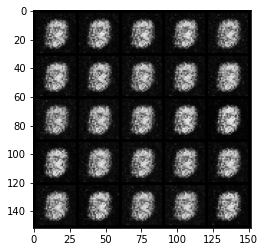

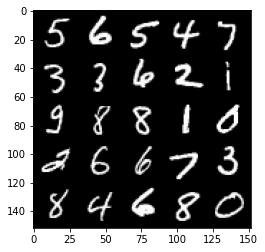

Step 1000: Generator loss: 1.7030732147693632, discriminator loss: 0.28913024392724057


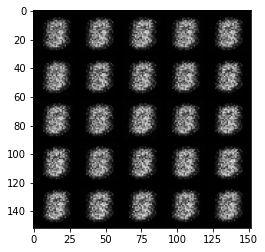

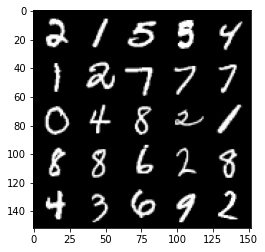

Step 1500: Generator loss: 1.9754416079521169, discriminator loss: 0.17259617447853093


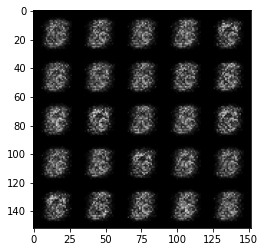

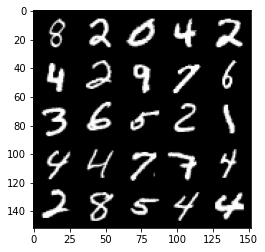

Step 2000: Generator loss: 1.7310566282272342, discriminator loss: 0.20938870626687997


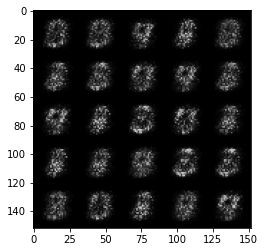

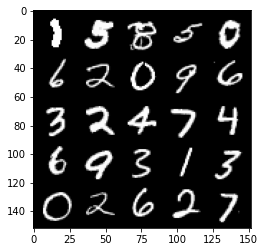

Step 2500: Generator loss: 1.744249454975128, discriminator loss: 0.1886098137497901


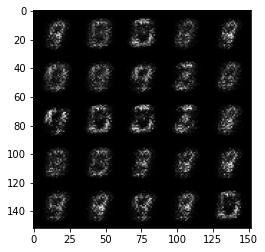

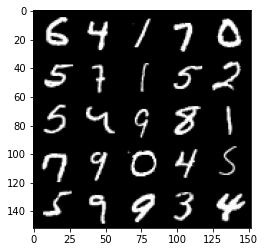

Step 3000: Generator loss: 2.0301418478488897, discriminator loss: 0.14713080307841317


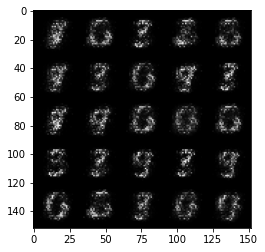

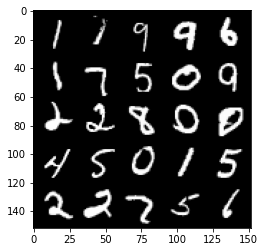

Step 3500: Generator loss: 2.325658596992492, discriminator loss: 0.1323667392134667


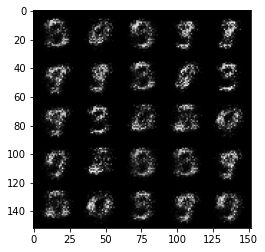

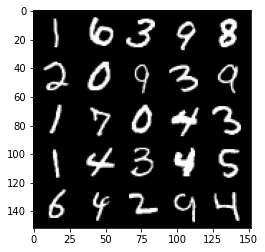

Step 4000: Generator loss: 2.753135971546175, discriminator loss: 0.1058167860135436


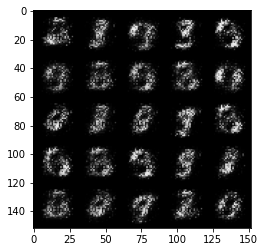

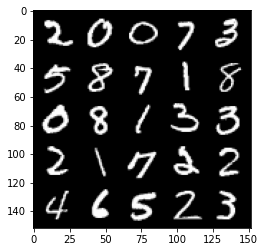

Step 4500: Generator loss: 3.1308958024978653, discriminator loss: 0.09936271007359035


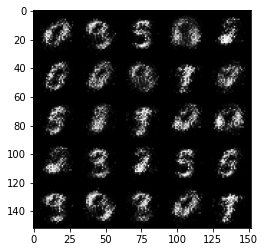

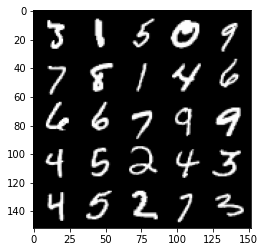

Step 5000: Generator loss: 3.3242303357124343, discriminator loss: 0.09107278296351443


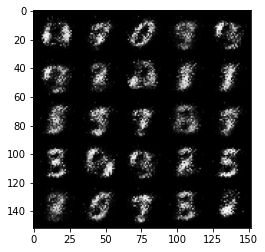

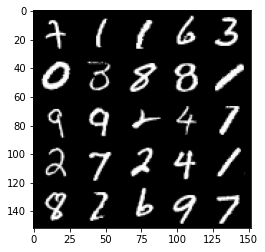

Step 5500: Generator loss: 3.70185711479187, discriminator loss: 0.07714971818029884


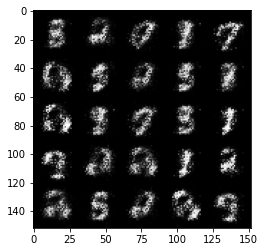

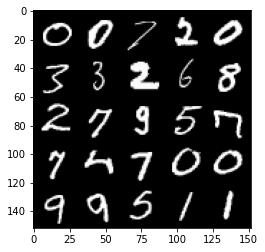

Step 6000: Generator loss: 3.6649620690345777, discriminator loss: 0.07963946711271995


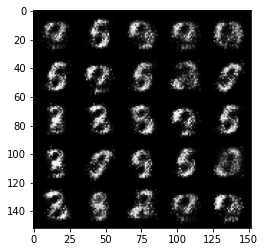

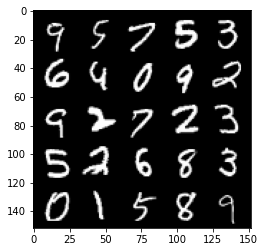

Step 6500: Generator loss: 3.925794524192812, discriminator loss: 0.07110106986761094


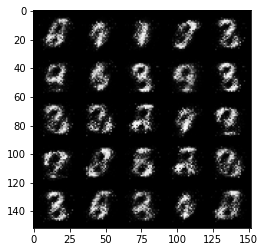

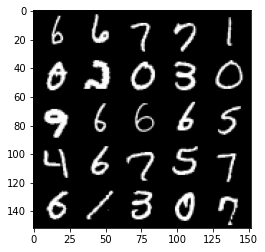

Step 7000: Generator loss: 3.9836739821434, discriminator loss: 0.062059219211339924


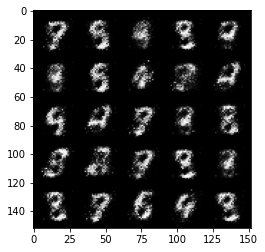

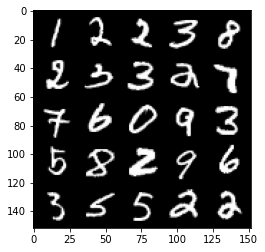

Step 7500: Generator loss: 4.0057058548927325, discriminator loss: 0.05490049665793775


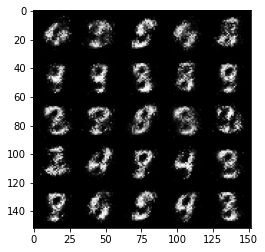

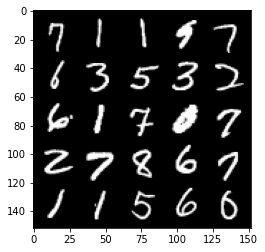

Step 8000: Generator loss: 3.807063033103941, discriminator loss: 0.06899518845975397


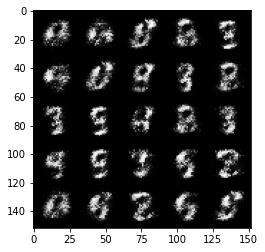

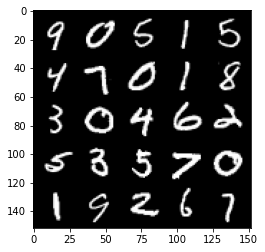

Step 8500: Generator loss: 3.845495000839234, discriminator loss: 0.06922792544960975


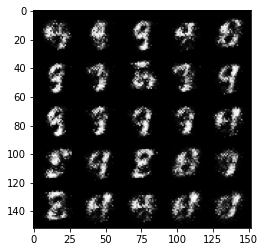

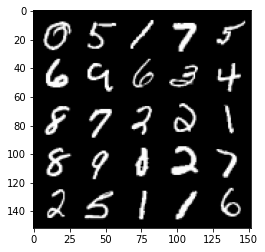

Step 9000: Generator loss: 4.126618435382841, discriminator loss: 0.06404994595050811


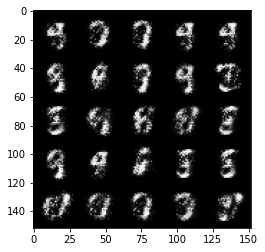

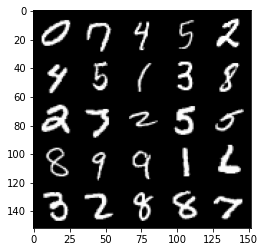

Step 9500: Generator loss: 3.966642386913299, discriminator loss: 0.0638240760937333


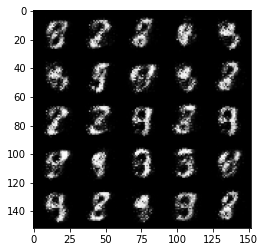

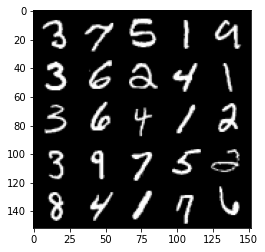

Step 10000: Generator loss: 4.2745921273231495, discriminator loss: 0.06344919055700303


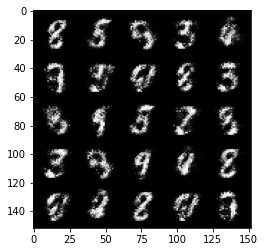

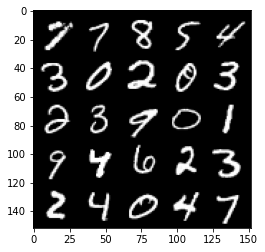

Step 10500: Generator loss: 4.013523909568781, discriminator loss: 0.07291451170295477


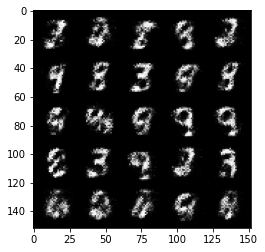

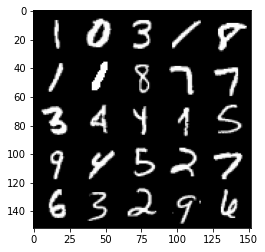

Step 11000: Generator loss: 3.9113937726020827, discriminator loss: 0.08269618543237452


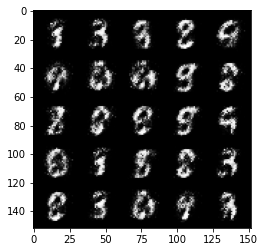

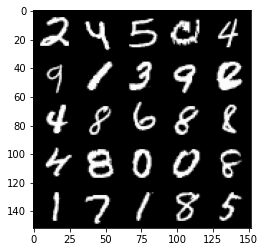

Step 11500: Generator loss: 3.9197388243675224, discriminator loss: 0.08207165105640894


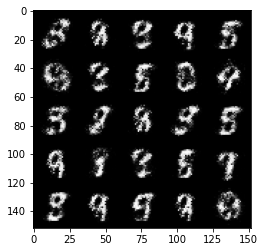

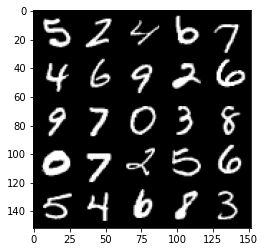

Step 12000: Generator loss: 3.8962959113121003, discriminator loss: 0.08726019904762504


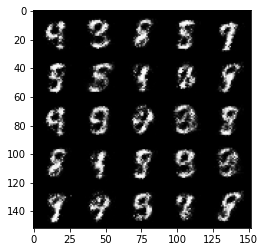

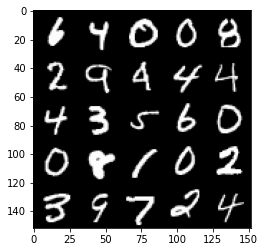

Step 12500: Generator loss: 3.9289066486358624, discriminator loss: 0.09161894326657048


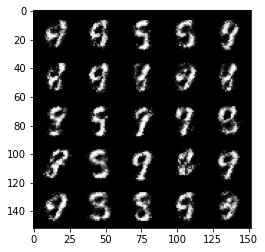

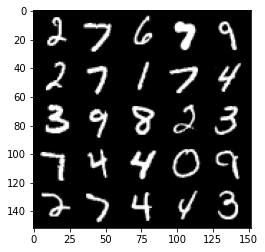

Step 13000: Generator loss: 3.7389137706756586, discriminator loss: 0.10836383327841757


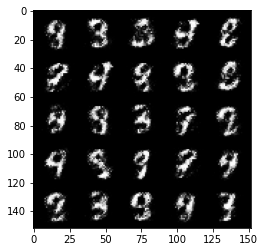

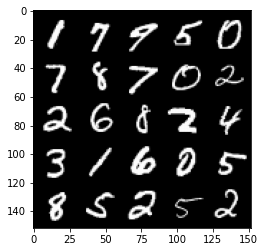

Step 13500: Generator loss: 3.6815847544670124, discriminator loss: 0.10820328133553277


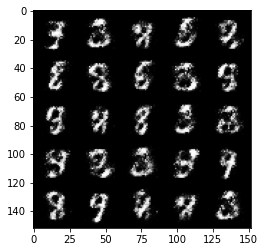

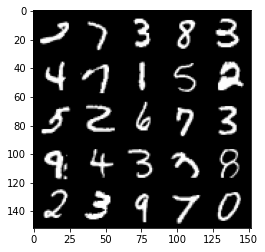

Step 14000: Generator loss: 3.716292165756229, discriminator loss: 0.11206940450519311


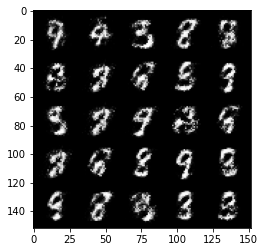

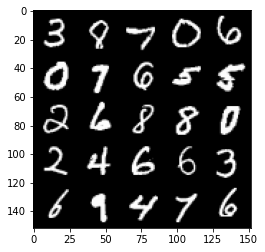

Step 14500: Generator loss: 3.665105951786042, discriminator loss: 0.11693409465253354


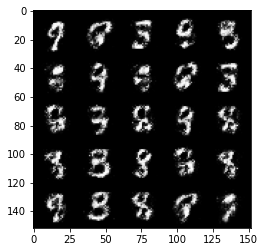

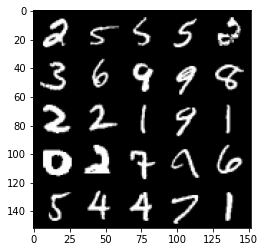

Step 15000: Generator loss: 3.7014365086555436, discriminator loss: 0.11131820490956316


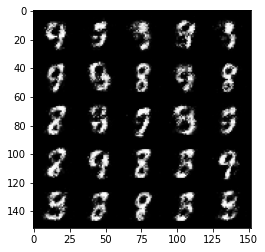

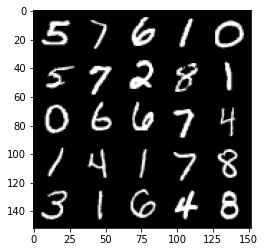

Step 15500: Generator loss: 3.8261030201911956, discriminator loss: 0.1067197272330523


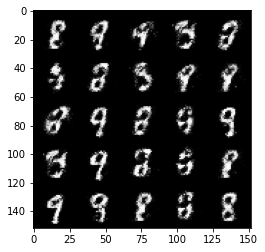

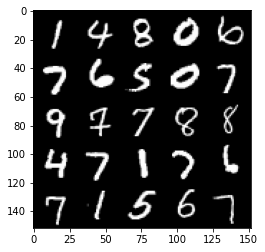

Step 16000: Generator loss: 3.534861756324769, discriminator loss: 0.12476371172815555


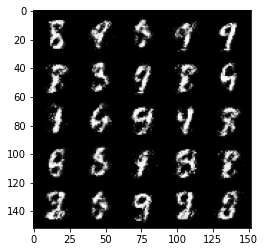

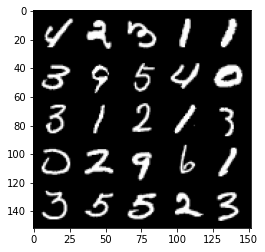

Step 16500: Generator loss: 3.4208611316680884, discriminator loss: 0.13937751838564882


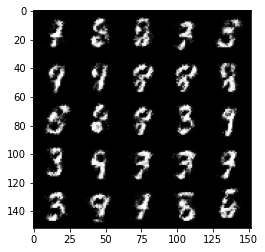

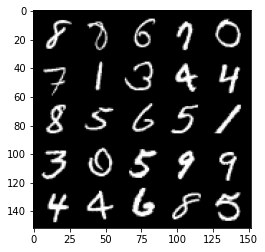

Step 17000: Generator loss: 3.409130281925202, discriminator loss: 0.13880971331149336


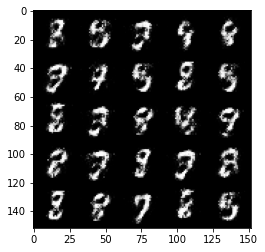

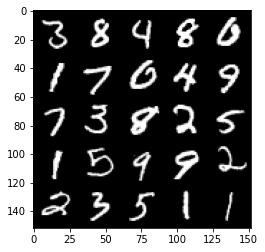

Step 17500: Generator loss: 3.2717323737144457, discriminator loss: 0.15084884960949424


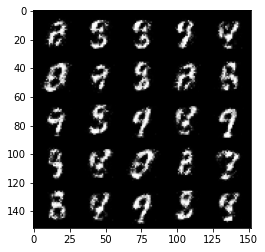

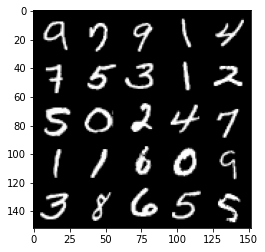

Step 18000: Generator loss: 3.353680473804475, discriminator loss: 0.13348209456354385


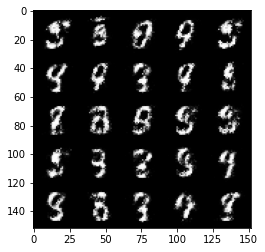

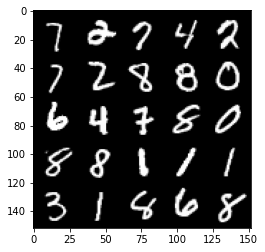

Step 18500: Generator loss: 3.4264151310920727, discriminator loss: 0.14562557202577595


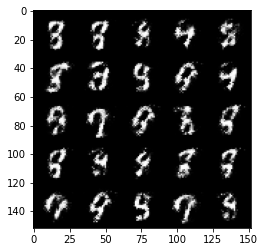

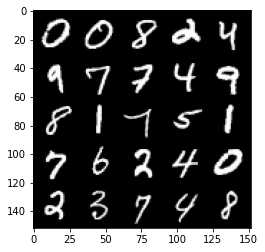

Step 19000: Generator loss: 3.201324355602268, discriminator loss: 0.15782990352809428


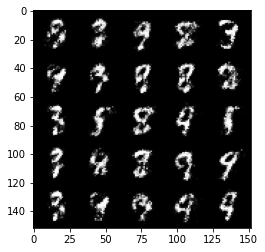

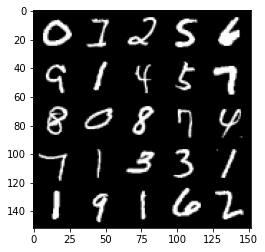

Step 19500: Generator loss: 3.3219654893875172, discriminator loss: 0.14340344126522553


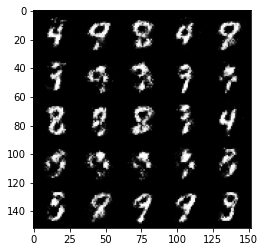

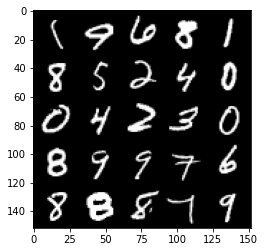

Step 20000: Generator loss: 3.3800892624855035, discriminator loss: 0.16274172087013705


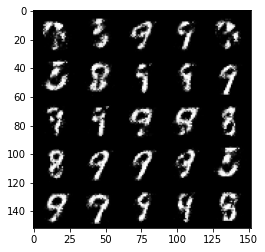

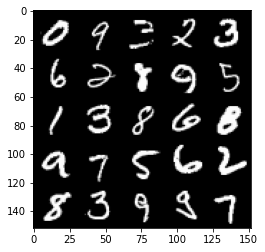

Step 20500: Generator loss: 3.3083172864913934, discriminator loss: 0.14989672519266606


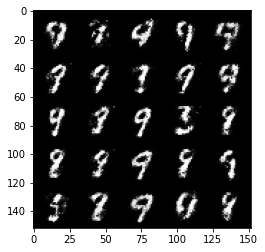

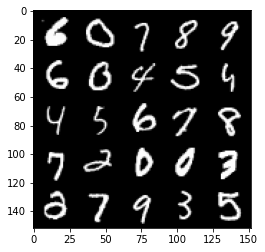

Step 21000: Generator loss: 3.0917944169044493, discriminator loss: 0.18137387609481812


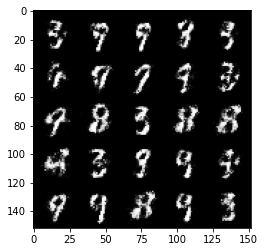

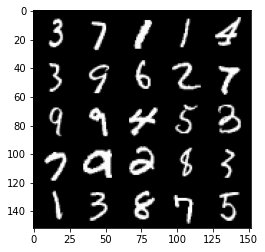

Step 21500: Generator loss: 3.079753554344181, discriminator loss: 0.17488537114858632


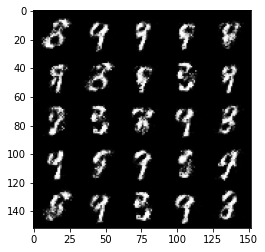

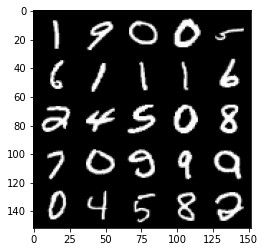

Step 22000: Generator loss: 3.2352614474296577, discriminator loss: 0.15333679305016978


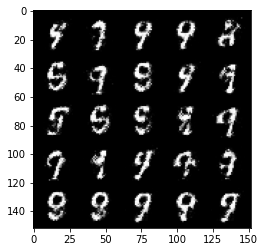

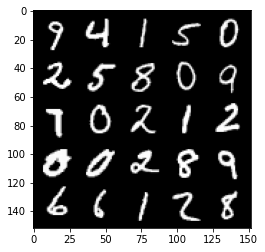

Step 22500: Generator loss: 3.2892497129440343, discriminator loss: 0.14897762434184536


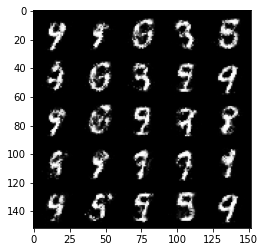

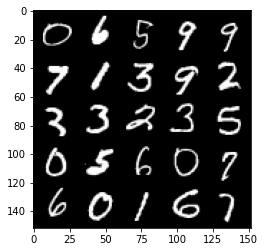

Step 23000: Generator loss: 3.2002856383323657, discriminator loss: 0.1579523193091153


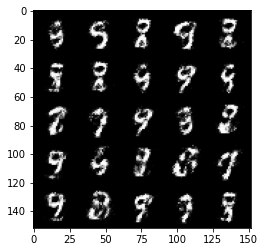

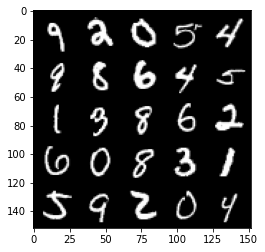

Step 23500: Generator loss: 3.1247642850875854, discriminator loss: 0.1709852596372367


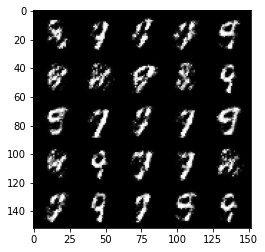

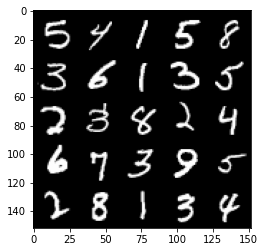

Step 24000: Generator loss: 2.950045799732207, discriminator loss: 0.197402038425207


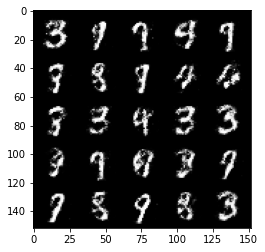

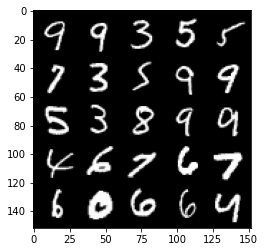

Step 24500: Generator loss: 2.88705457687378, discriminator loss: 0.1962614436745643


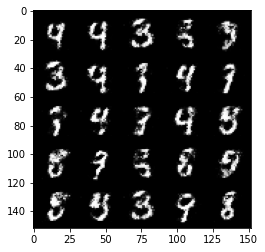

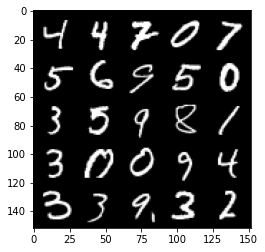

Step 25000: Generator loss: 3.031007154464721, discriminator loss: 0.19666725350916386


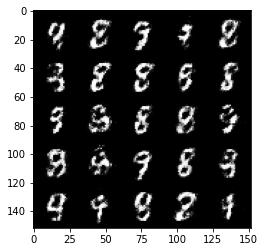

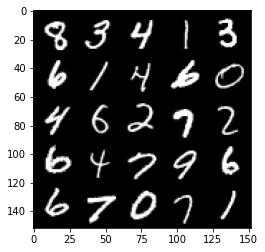

Step 25500: Generator loss: 2.863502102851865, discriminator loss: 0.1976564913541077


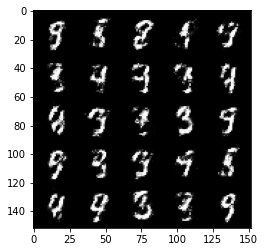

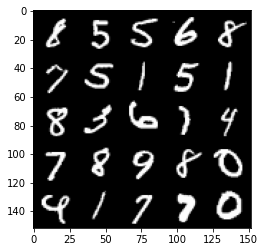

Step 26000: Generator loss: 2.8723353080749487, discriminator loss: 0.18890144167840472


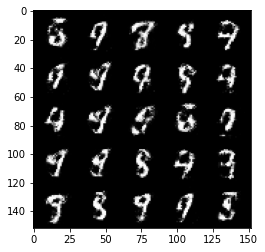

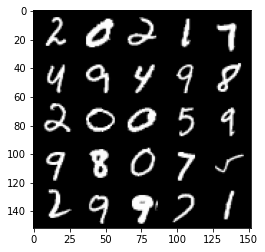

Step 26500: Generator loss: 2.853953878879548, discriminator loss: 0.20522340929508198


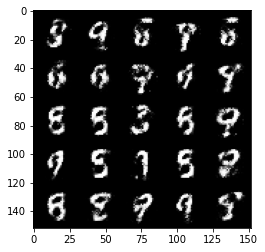

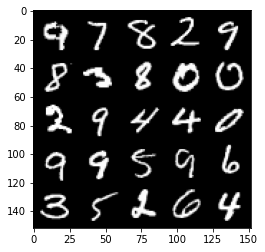

Step 27000: Generator loss: 2.8545749530792244, discriminator loss: 0.21222878187894806


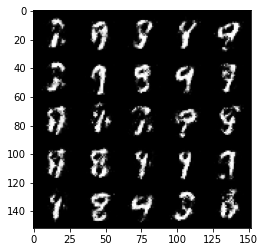

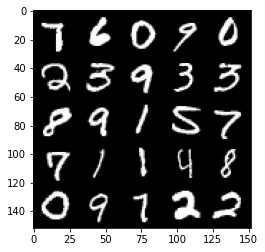

Step 27500: Generator loss: 2.6656477870941147, discriminator loss: 0.2270570237040519


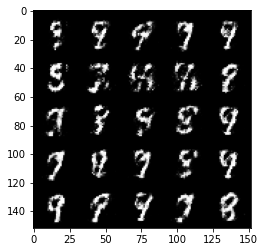

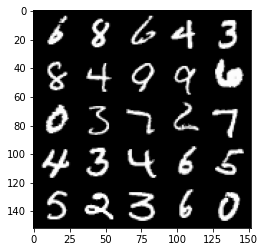

Step 28000: Generator loss: 2.689401342868805, discriminator loss: 0.2140072531551122


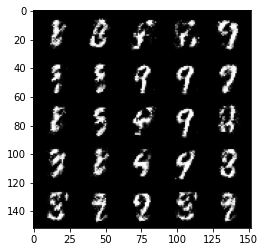

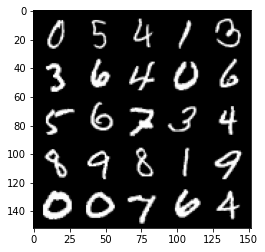

Step 28500: Generator loss: 2.638703055381778, discriminator loss: 0.23523508068919186


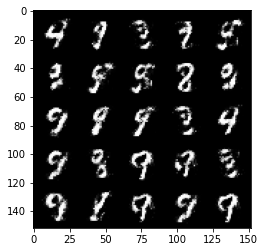

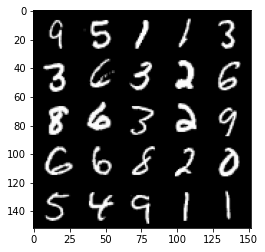

Step 29000: Generator loss: 2.695916698932649, discriminator loss: 0.24280585309863112


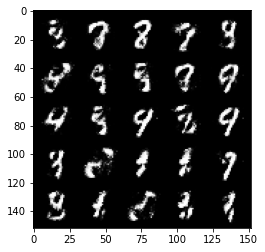

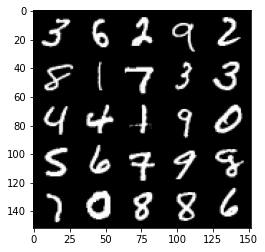

Step 29500: Generator loss: 2.6085614807605757, discriminator loss: 0.2447694818079472


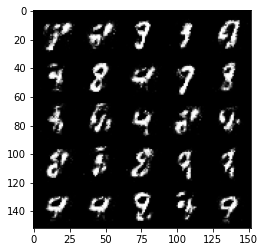

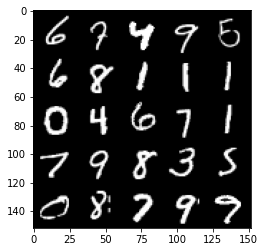

Step 30000: Generator loss: 2.481785233736035, discriminator loss: 0.2624405114948752


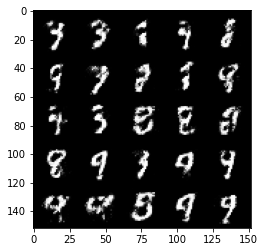

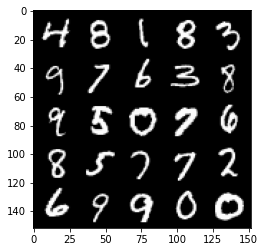

Step 30500: Generator loss: 2.43486883401871, discriminator loss: 0.2757801058590413


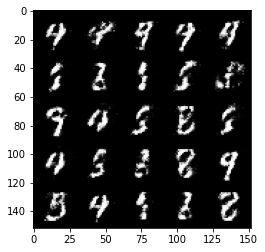

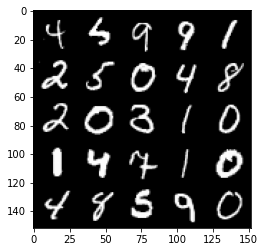

Step 31000: Generator loss: 2.5273936152458174, discriminator loss: 0.235317741304636


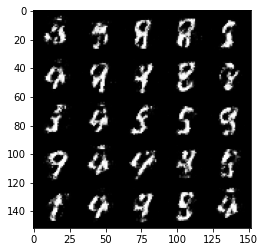

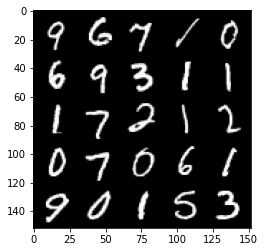

Step 31500: Generator loss: 2.436253669500352, discriminator loss: 0.26657967329025295


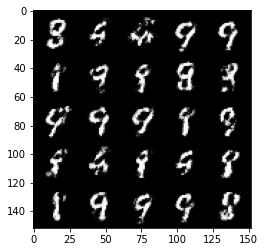

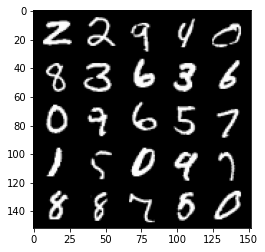

Step 32000: Generator loss: 2.3941147098541267, discriminator loss: 0.26419648954272285


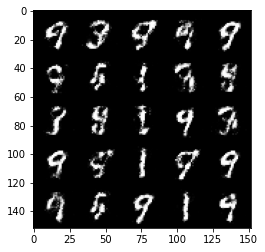

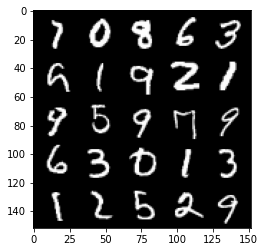

Step 32500: Generator loss: 2.3972241358757014, discriminator loss: 0.267353425860405


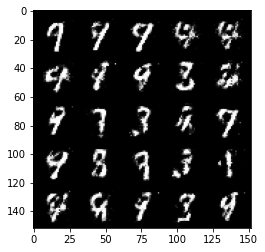

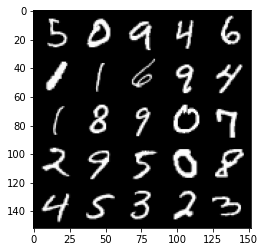

Step 33000: Generator loss: 2.3983903555870048, discriminator loss: 0.2539647842943668


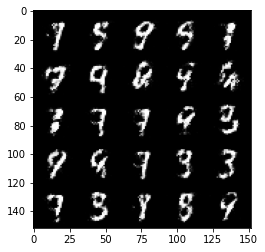

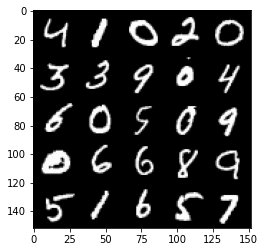

Step 33500: Generator loss: 2.371232975006102, discriminator loss: 0.25825165468454364


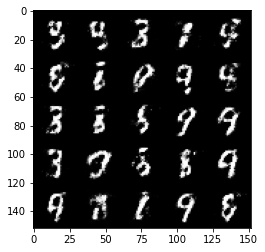

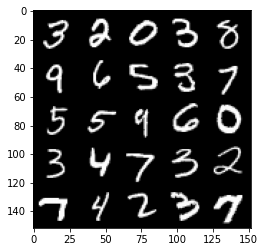

Step 34000: Generator loss: 2.458525907278061, discriminator loss: 0.2491468691527844


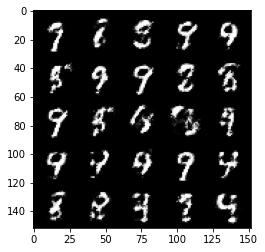

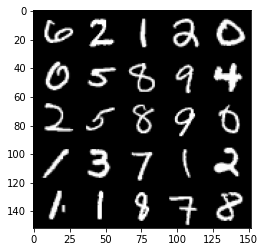

Step 34500: Generator loss: 2.415075181245806, discriminator loss: 0.2540352010428903


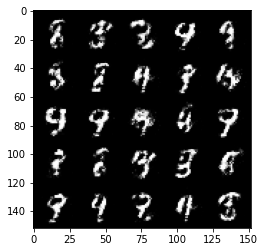

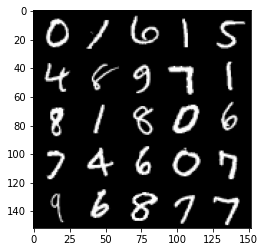

Step 35000: Generator loss: 2.431563206434251, discriminator loss: 0.249828309774399


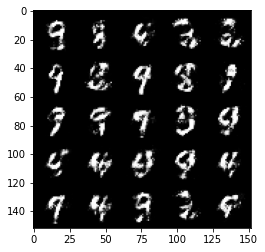

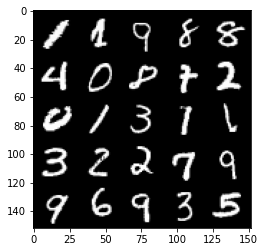

Step 35500: Generator loss: 2.470455531120299, discriminator loss: 0.25946676096320165


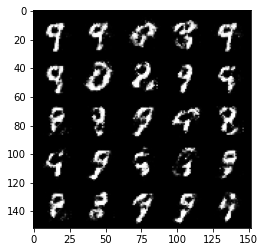

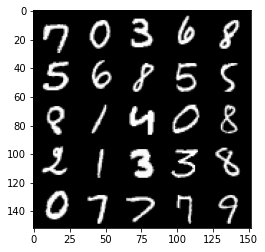

Step 36000: Generator loss: 2.366558249711987, discriminator loss: 0.26725362214446063


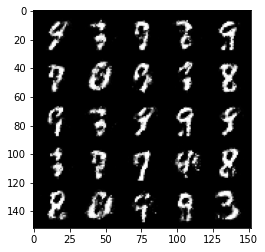

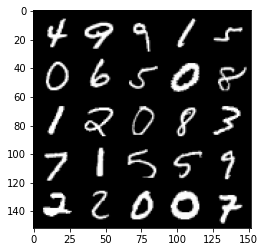

Step 36500: Generator loss: 2.290171075582506, discriminator loss: 0.2872053464055062


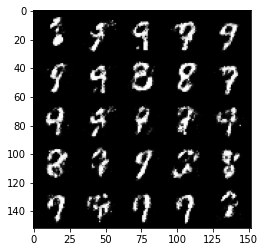

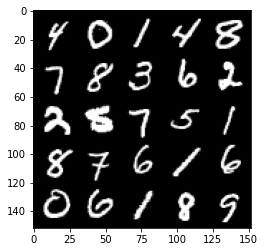

Step 37000: Generator loss: 2.2409719443321214, discriminator loss: 0.2776064360439777


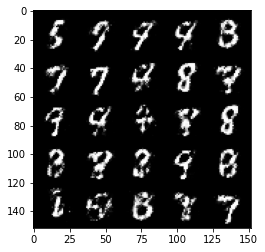

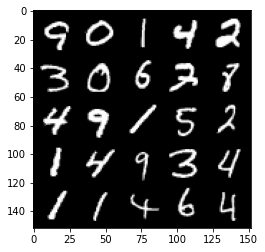

Step 37500: Generator loss: 2.280497692108154, discriminator loss: 0.2740641587972642


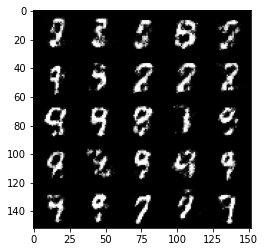

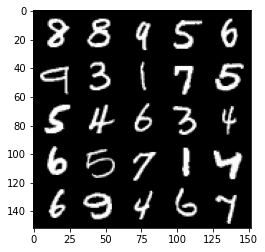

Step 38000: Generator loss: 2.1789451894760132, discriminator loss: 0.2952529276609419


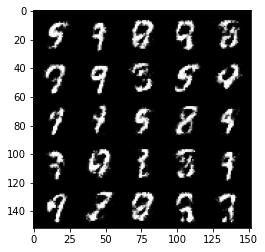

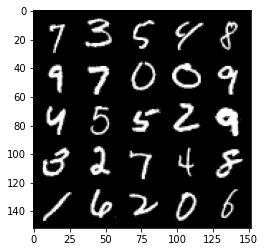

Step 38500: Generator loss: 2.2122323572635643, discriminator loss: 0.2867819898128509


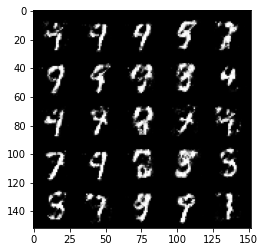

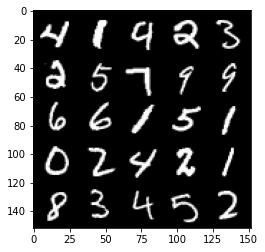

Step 39000: Generator loss: 2.1362214014530174, discriminator loss: 0.3102274148464201


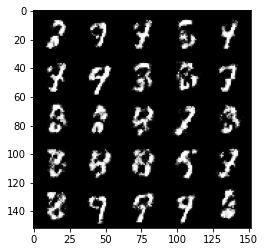

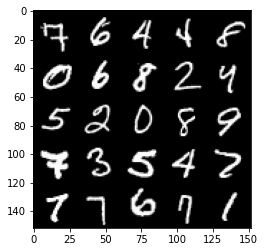

Step 39500: Generator loss: 2.1334688503742227, discriminator loss: 0.30689470139145875


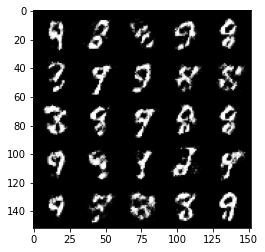

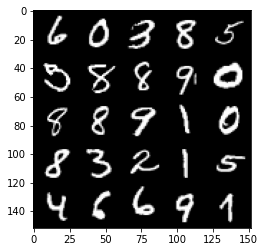

Step 40000: Generator loss: 2.180075719833377, discriminator loss: 0.2878814953565596


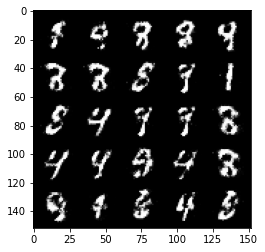

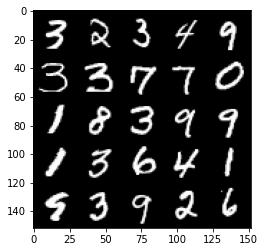

Step 40500: Generator loss: 2.2047105646133436, discriminator loss: 0.29635424458980575


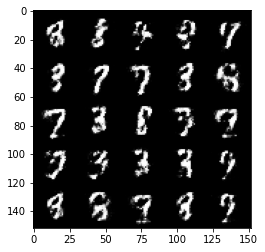

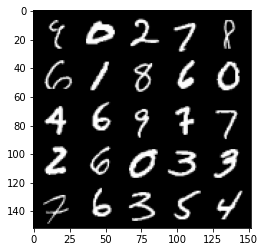

Step 41000: Generator loss: 2.128331114053725, discriminator loss: 0.3090153812468052


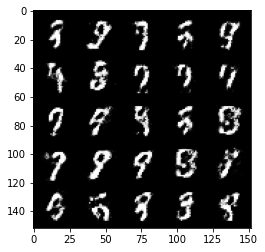

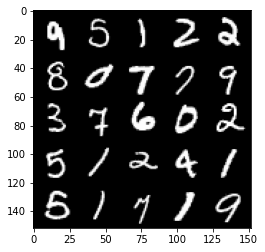

Step 41500: Generator loss: 2.124726527452469, discriminator loss: 0.30193764033913617


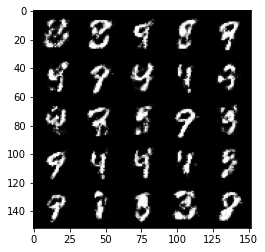

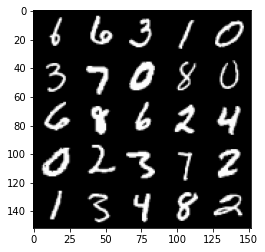

Step 42000: Generator loss: 2.0911566715240473, discriminator loss: 0.30941740971803655


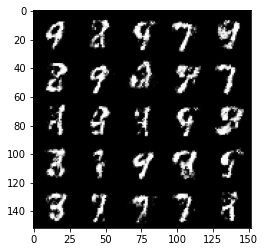

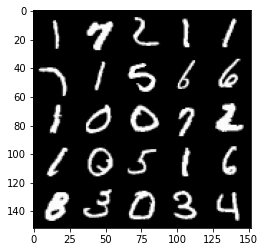

Step 42500: Generator loss: 2.085906868696214, discriminator loss: 0.3100204027295112


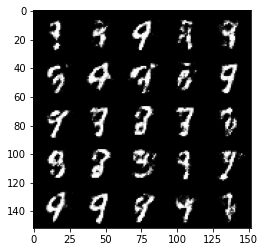

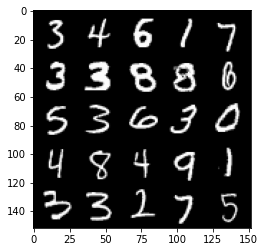

Step 43000: Generator loss: 2.068005546092989, discriminator loss: 0.30250679972767813


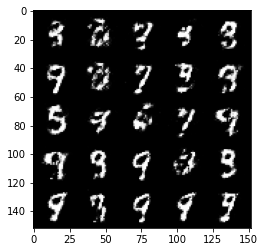

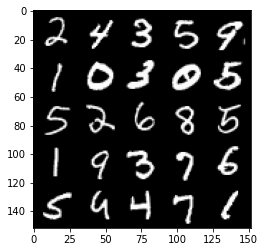

Step 43500: Generator loss: 2.1172005918025976, discriminator loss: 0.3031596686542033


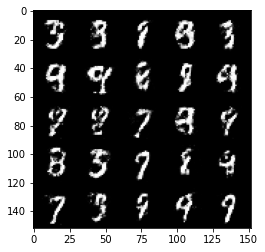

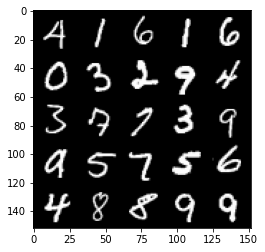

Step 44000: Generator loss: 2.0532134060859675, discriminator loss: 0.31776550117135066


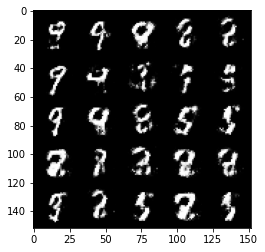

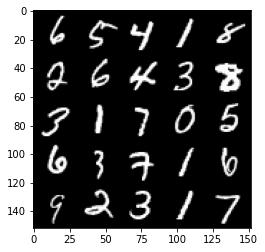

Step 44500: Generator loss: 1.9893576803207391, discriminator loss: 0.3508392138183121


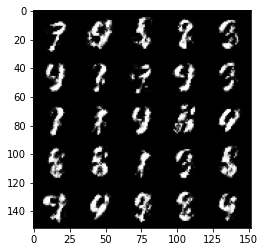

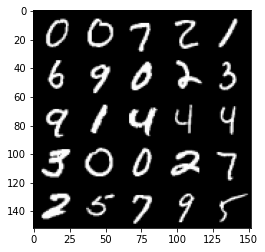

Step 45000: Generator loss: 2.0160500581264493, discriminator loss: 0.3210445077121257


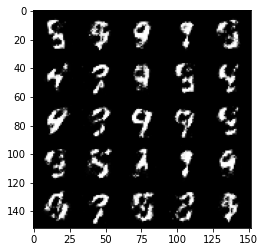

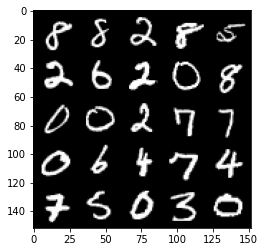

Step 45500: Generator loss: 1.990488728523254, discriminator loss: 0.3254901703000068


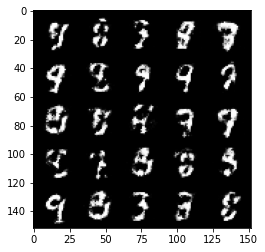

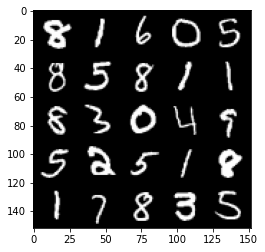

Step 46000: Generator loss: 2.0359022948741896, discriminator loss: 0.3042885850965979


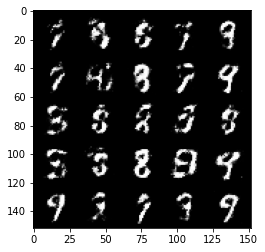

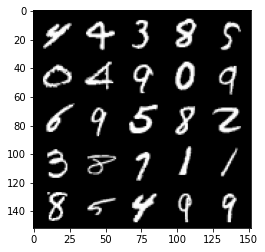

Step 46500: Generator loss: 2.0718243646621715, discriminator loss: 0.3010059942603112


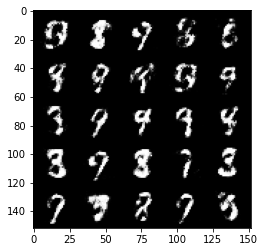

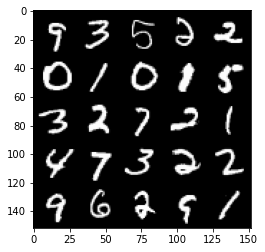

Step 47000: Generator loss: 2.007784490585327, discriminator loss: 0.32484704172611245


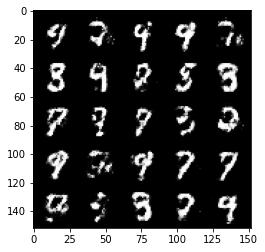

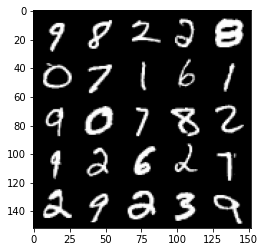

Step 47500: Generator loss: 1.9307747483253481, discriminator loss: 0.3534990393817427


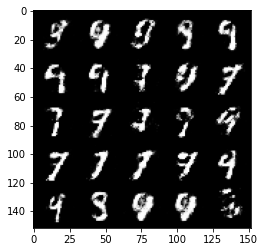

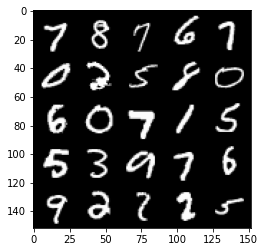

Step 48000: Generator loss: 1.9093416469097142, discriminator loss: 0.33128098052740085


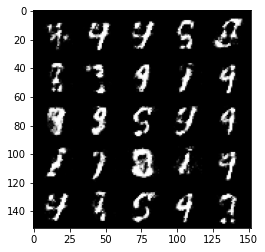

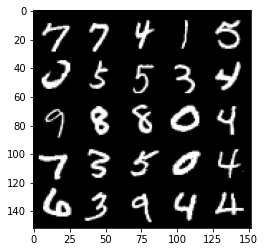

Step 48500: Generator loss: 1.8635340273380276, discriminator loss: 0.3511991938948631


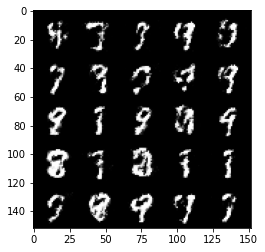

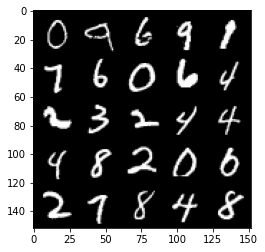

Step 49000: Generator loss: 1.8978744020462046, discriminator loss: 0.33525635766983064


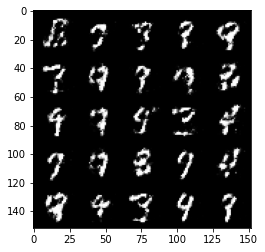

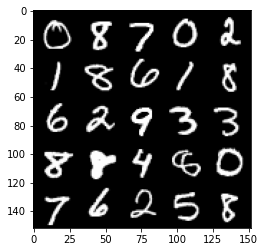

Step 49500: Generator loss: 1.8620688853263838, discriminator loss: 0.37451081603765496


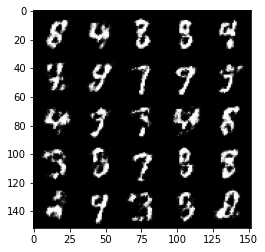

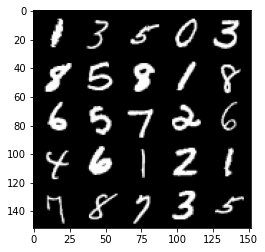

Step 50000: Generator loss: 1.8302479526996607, discriminator loss: 0.37052417469024657


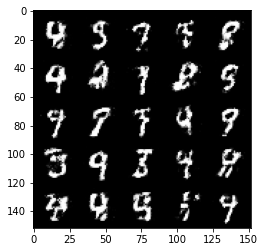

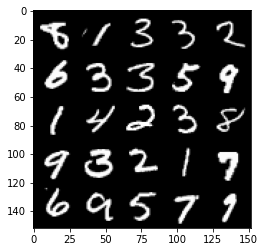

Step 50500: Generator loss: 1.8321675121784213, discriminator loss: 0.37149168241024044


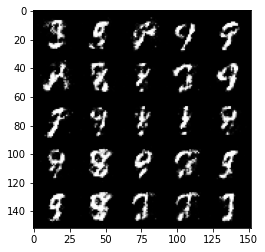

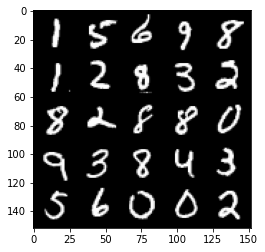

Step 51000: Generator loss: 1.8622969653606425, discriminator loss: 0.33524660012125973


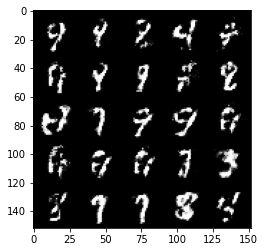

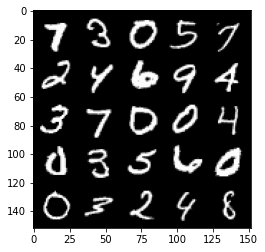

Step 51500: Generator loss: 1.9659913575649264, discriminator loss: 0.3196553020477297


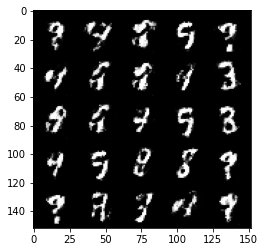

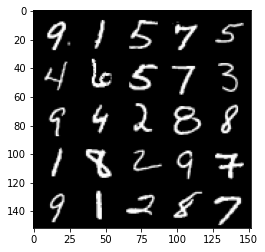

Step 52000: Generator loss: 1.9732411091327668, discriminator loss: 0.3367893278598785


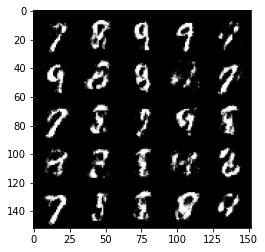

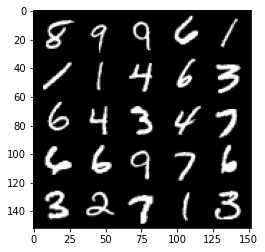

Step 52500: Generator loss: 1.8561178219318373, discriminator loss: 0.3602621960639953


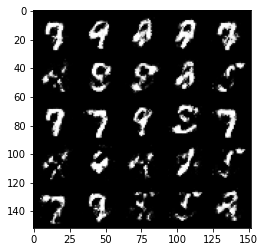

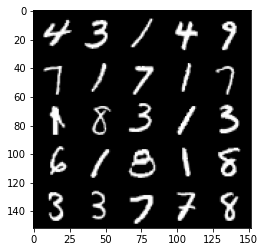

Step 53000: Generator loss: 1.931382331371307, discriminator loss: 0.3330593044161796


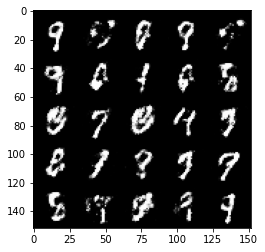

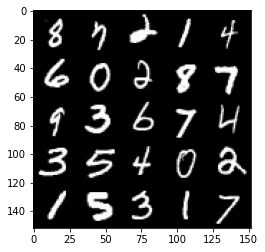

Step 53500: Generator loss: 1.756303139209747, discriminator loss: 0.36547714686393756


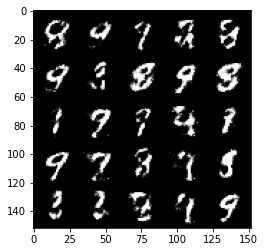

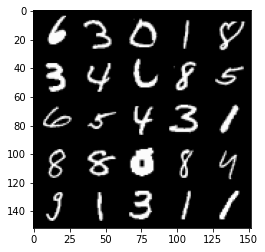

Step 54000: Generator loss: 1.8705596694946283, discriminator loss: 0.3341318962275978


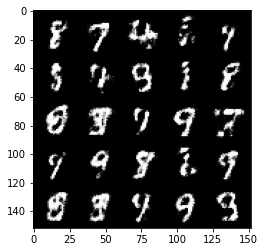

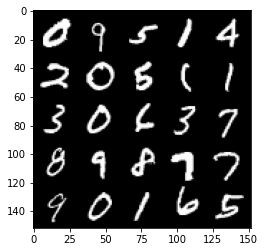

Step 54500: Generator loss: 1.7882768993377687, discriminator loss: 0.376575650751591


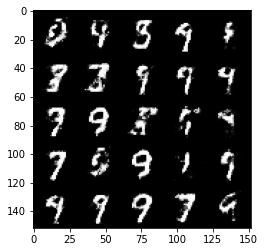

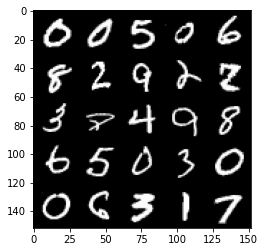

Step 55000: Generator loss: 1.8184831988811492, discriminator loss: 0.35527604523301143


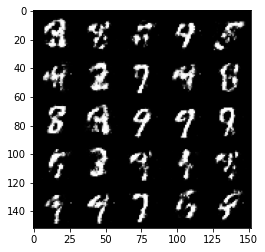

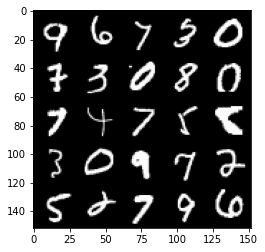

Step 55500: Generator loss: 1.8908625919818864, discriminator loss: 0.338218956679106


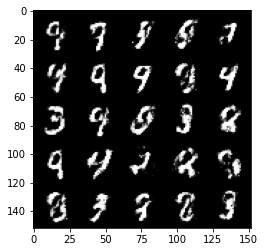

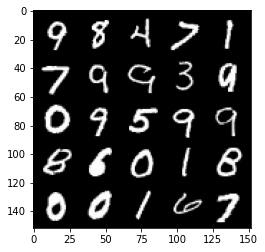

Step 56000: Generator loss: 1.903297953128813, discriminator loss: 0.3340360417664053


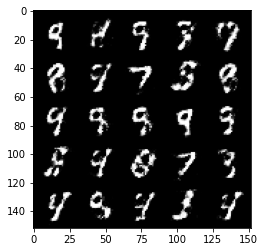

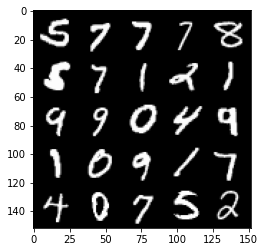

Step 56500: Generator loss: 1.8317956280708285, discriminator loss: 0.3544244399666791


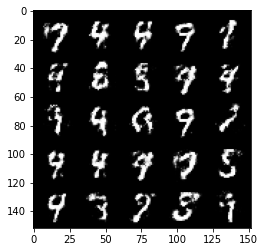

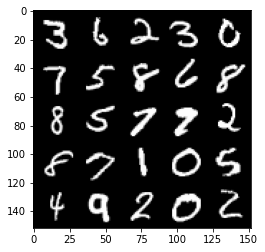

Step 57000: Generator loss: 1.7132160937786107, discriminator loss: 0.37863352000713346


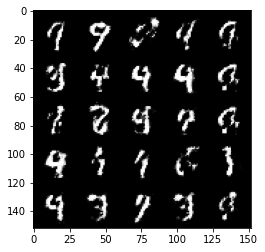

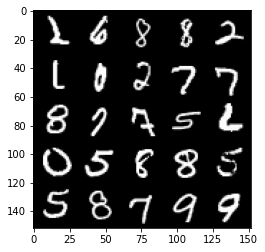

Step 57500: Generator loss: 1.817599982976914, discriminator loss: 0.3421334957778455


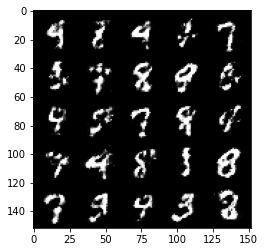

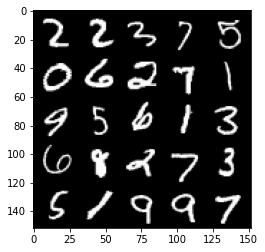

Step 58000: Generator loss: 1.7275685596466066, discriminator loss: 0.37198898583650575


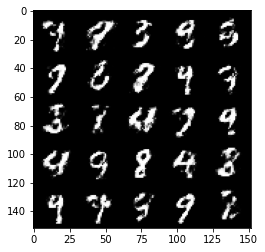

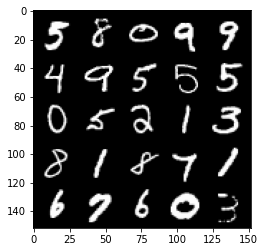

Step 58500: Generator loss: 1.734484511137009, discriminator loss: 0.370842525303364


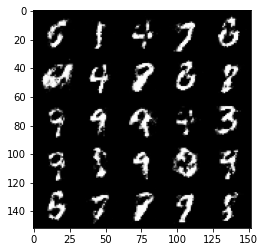

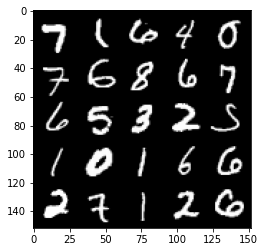

Step 59000: Generator loss: 1.7173164143562327, discriminator loss: 0.38259956079721413


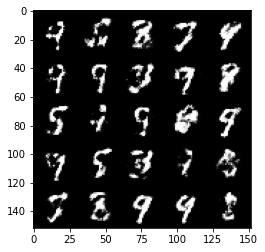

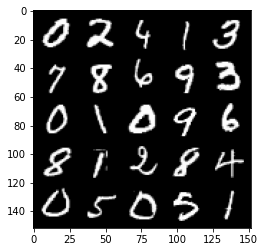

Step 59500: Generator loss: 1.6628498418331152, discriminator loss: 0.3869293737411502


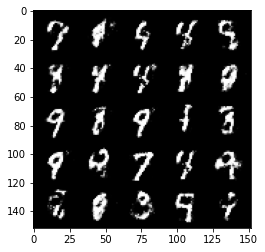

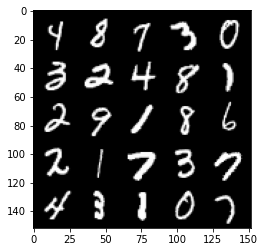

Step 60000: Generator loss: 1.6263118319511403, discriminator loss: 0.4026191142797465


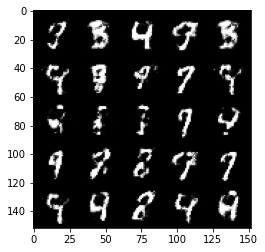

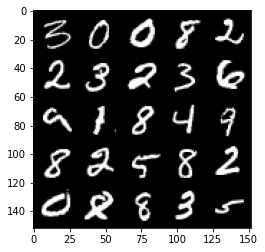

Step 60500: Generator loss: 1.5865106503963464, discriminator loss: 0.4075902299284936


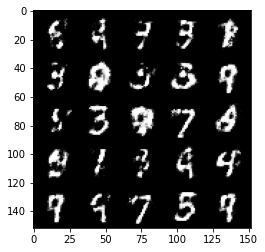

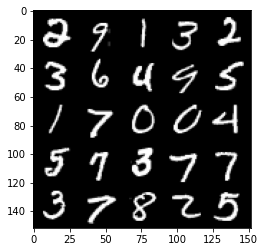

Step 61000: Generator loss: 1.6270172488689405, discriminator loss: 0.39070242196321486


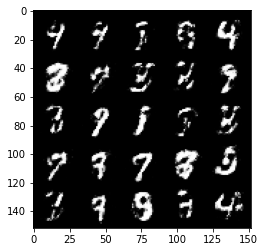

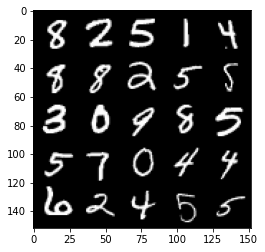

Step 61500: Generator loss: 1.582435672998428, discriminator loss: 0.3992172675728798


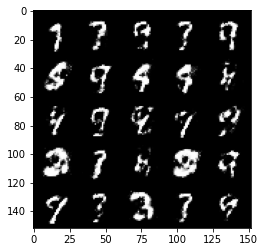

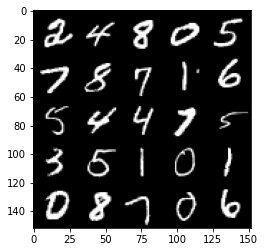

Step 62000: Generator loss: 1.62638123178482, discriminator loss: 0.3837187389135362


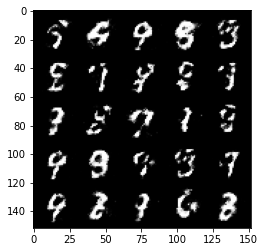

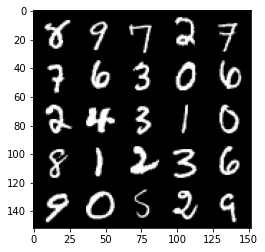

Step 62500: Generator loss: 1.6278987319469471, discriminator loss: 0.39620393526554143


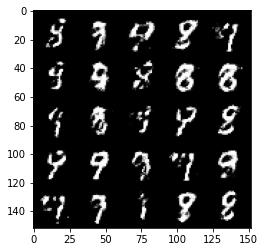

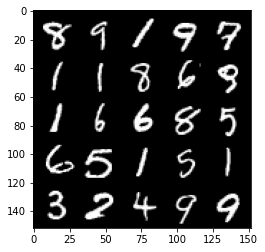

Step 63000: Generator loss: 1.6113809592723844, discriminator loss: 0.41668685138225503


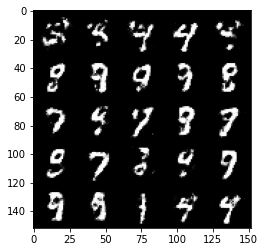

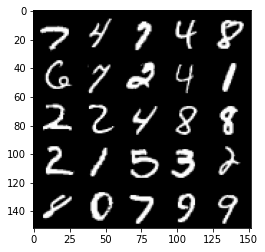

Step 63500: Generator loss: 1.6102628099918377, discriminator loss: 0.40710463804006614


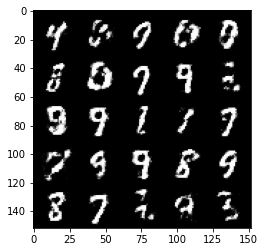

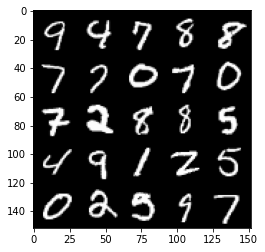

Step 64000: Generator loss: 1.5751719369888306, discriminator loss: 0.4128076097965245


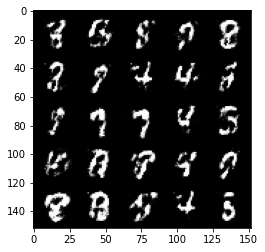

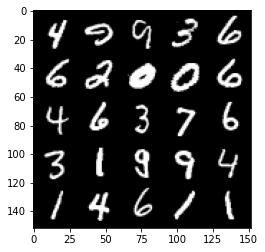

Step 64500: Generator loss: 1.6371219091415414, discriminator loss: 0.38848773992061625


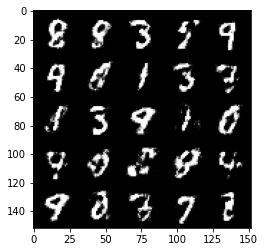

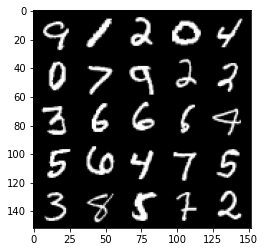

Step 65000: Generator loss: 1.544254055976869, discriminator loss: 0.41594219690561274


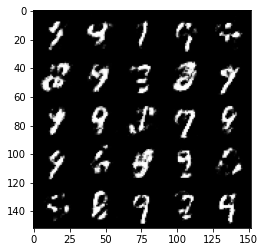

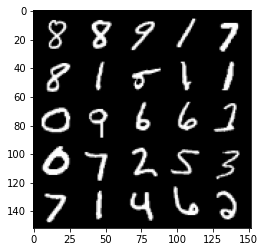

Step 65500: Generator loss: 1.5463816001415256, discriminator loss: 0.41870756471157095


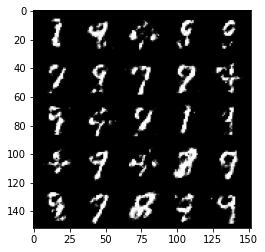

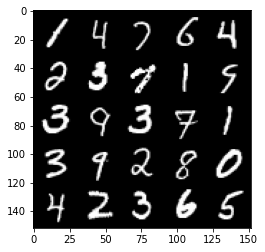

Step 66000: Generator loss: 1.5933333966732033, discriminator loss: 0.39795958530902864


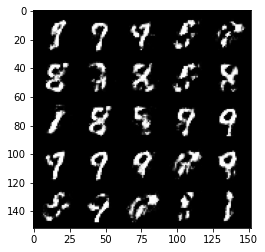

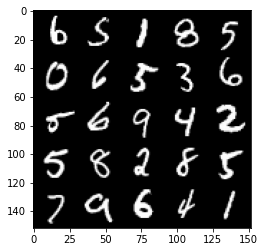

Step 66500: Generator loss: 1.6615353164672837, discriminator loss: 0.39198013520240804


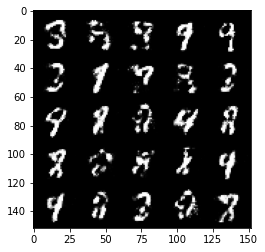

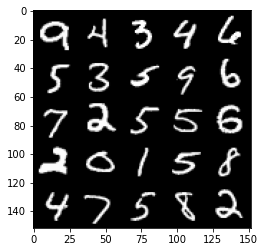

Step 67000: Generator loss: 1.556042854785919, discriminator loss: 0.413103904724121


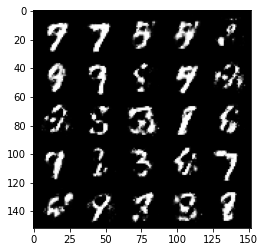

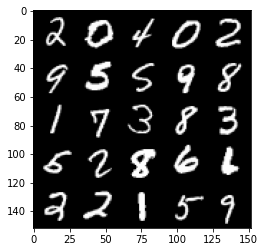

Step 67500: Generator loss: 1.5307664058208468, discriminator loss: 0.4131736567020417


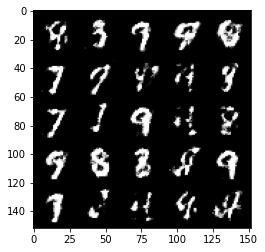

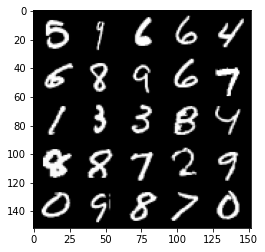

Step 68000: Generator loss: 1.5171888806819915, discriminator loss: 0.4078041427731514


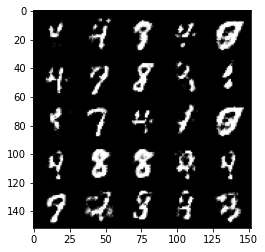

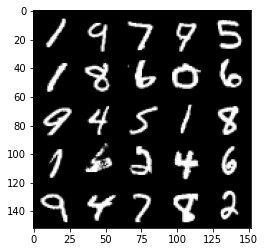

Step 68500: Generator loss: 1.4952658793926232, discriminator loss: 0.42134124314785004


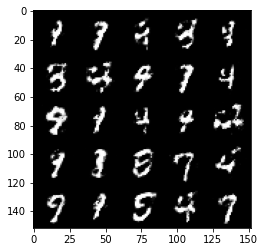

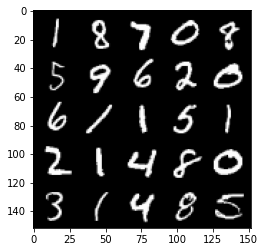

Step 69000: Generator loss: 1.423717175245285, discriminator loss: 0.43707800394296675


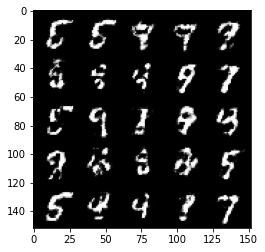

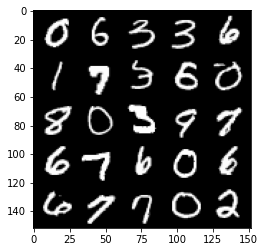

Step 69500: Generator loss: 1.4938425350189202, discriminator loss: 0.4256623352169991


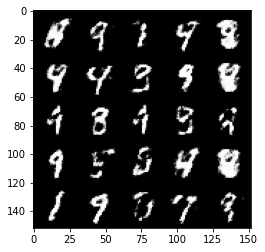

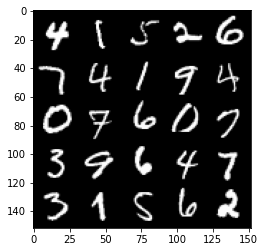

Step 70000: Generator loss: 1.363414771318437, discriminator loss: 0.46533446276187895


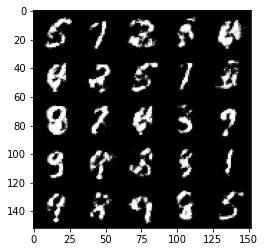

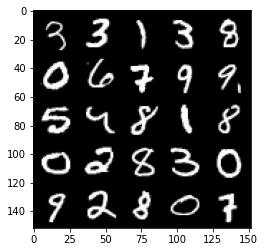

Step 70500: Generator loss: 1.468232598066329, discriminator loss: 0.4328349979519842


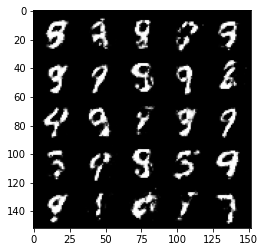

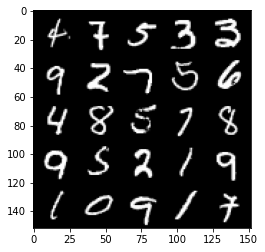

Step 71000: Generator loss: 1.458868479013444, discriminator loss: 0.4458291557431224


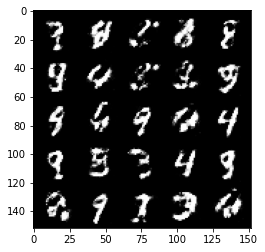

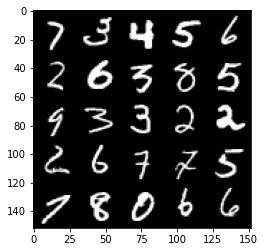

Step 71500: Generator loss: 1.496970467090606, discriminator loss: 0.42145913428068144


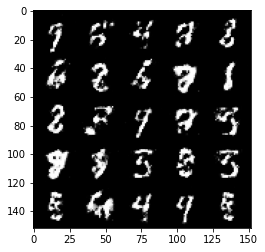

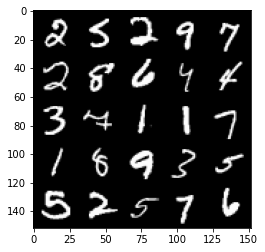

Step 72000: Generator loss: 1.547289316177369, discriminator loss: 0.40644529610872293


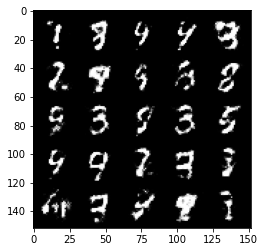

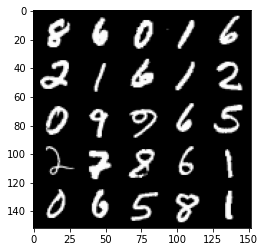

Step 72500: Generator loss: 1.4950812535285953, discriminator loss: 0.41722495979070684


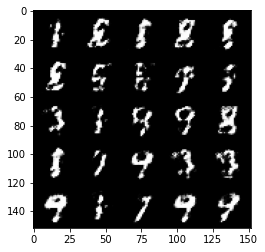

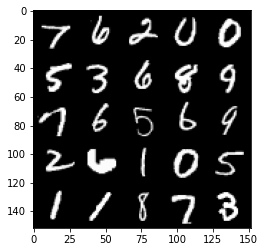

Step 73000: Generator loss: 1.5541373636722564, discriminator loss: 0.3895294897556311


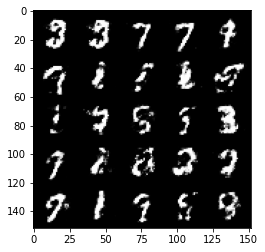

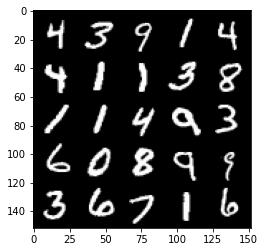

Step 73500: Generator loss: 1.5330031712055197, discriminator loss: 0.40820298957824724


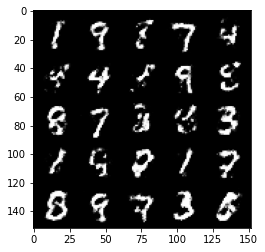

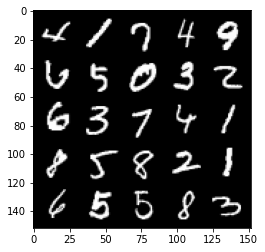

Step 74000: Generator loss: 1.5274691827297213, discriminator loss: 0.4121656772494316


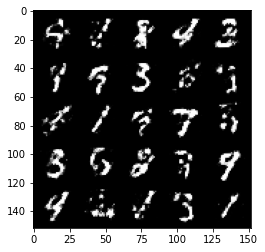

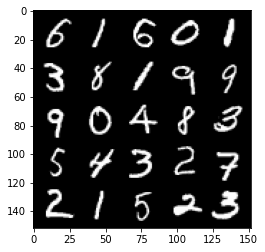

Step 74500: Generator loss: 1.5001787164211267, discriminator loss: 0.4224972403645515


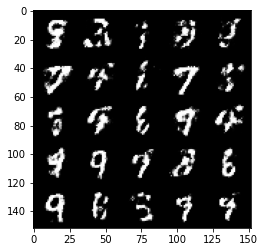

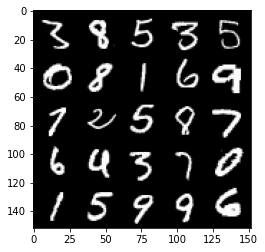

Step 75000: Generator loss: 1.4676876738071443, discriminator loss: 0.4294919918179511


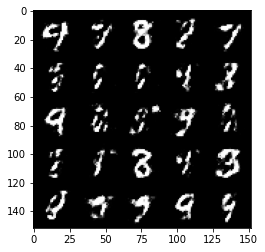

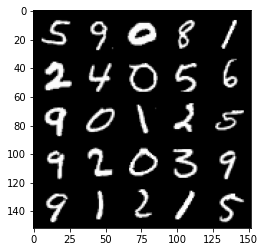

Step 75500: Generator loss: 1.5510723595619211, discriminator loss: 0.4040175738930706


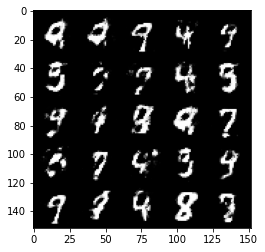

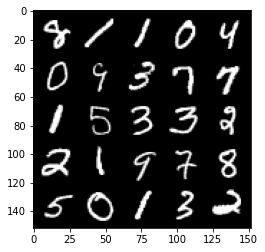

Step 76000: Generator loss: 1.4034572546482083, discriminator loss: 0.45414133983850447


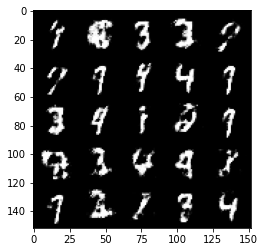

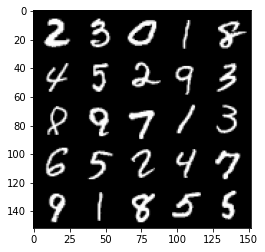

Step 76500: Generator loss: 1.449990735530855, discriminator loss: 0.43395859724283214


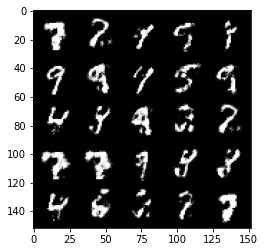

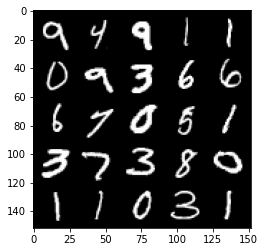

Step 77000: Generator loss: 1.4632010221481344, discriminator loss: 0.43313695412874204


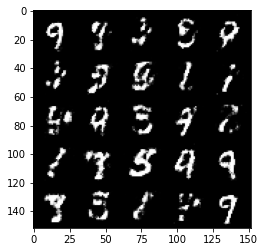

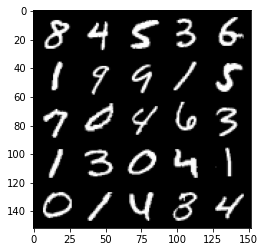

Step 77500: Generator loss: 1.4210206372737884, discriminator loss: 0.4494784280657769


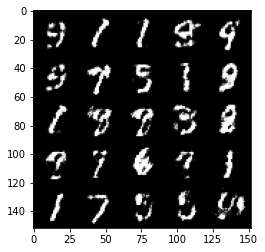

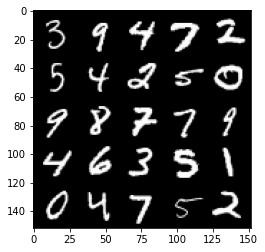

Step 78000: Generator loss: 1.4175317938327803, discriminator loss: 0.4480546952486041


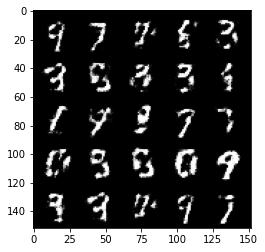

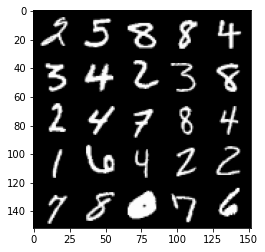

Step 78500: Generator loss: 1.357550083160399, discriminator loss: 0.46882935839891454


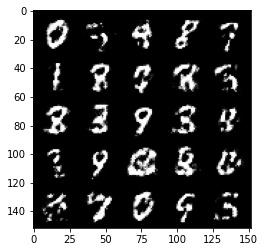

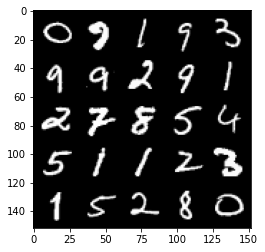

Step 79000: Generator loss: 1.2822254257202137, discriminator loss: 0.49904415786266354


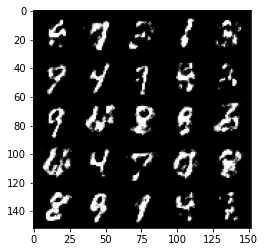

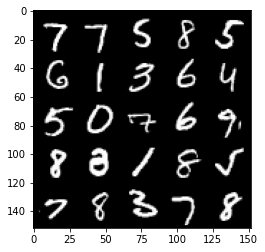

Step 79500: Generator loss: 1.2674080815315238, discriminator loss: 0.49475399571657125


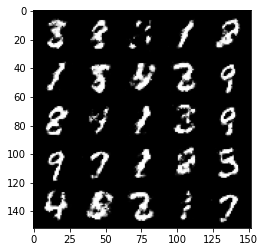

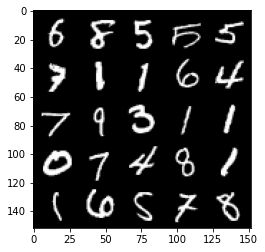

Step 80000: Generator loss: 1.2827129824161536, discriminator loss: 0.483204630374909


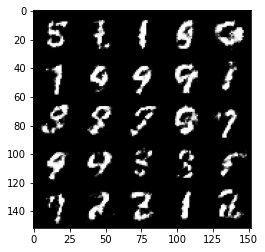

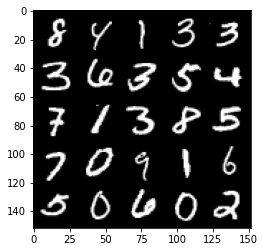

Step 80500: Generator loss: 1.3852010376453396, discriminator loss: 0.44564436221122755


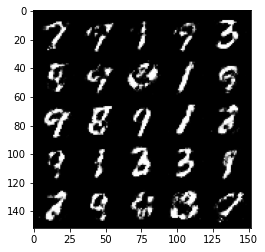

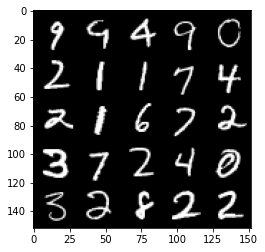

Step 81000: Generator loss: 1.3060356962680815, discriminator loss: 0.4862214430570605


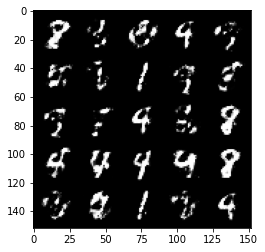

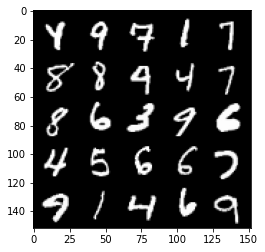

Step 81500: Generator loss: 1.2743388512134546, discriminator loss: 0.49469138312339817


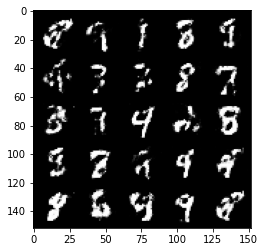

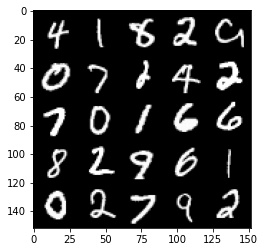

Step 82000: Generator loss: 1.3273155016899114, discriminator loss: 0.4608143900632858


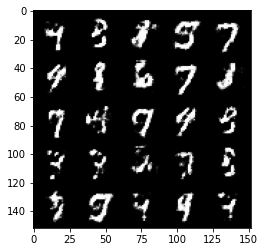

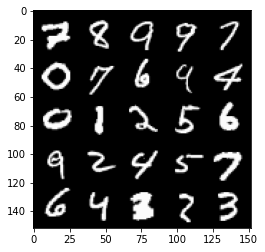

Step 82500: Generator loss: 1.352481481552123, discriminator loss: 0.46481525099277476


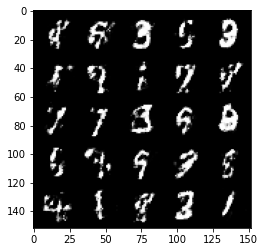

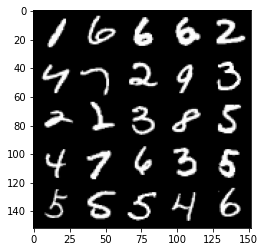

Step 83000: Generator loss: 1.3172545163631446, discriminator loss: 0.46562284719943997


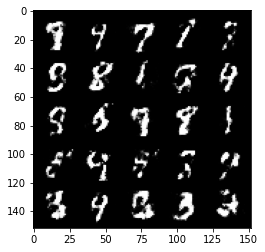

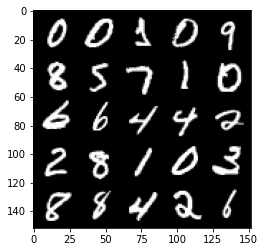

Step 83500: Generator loss: 1.2962728817462918, discriminator loss: 0.47477927350997884


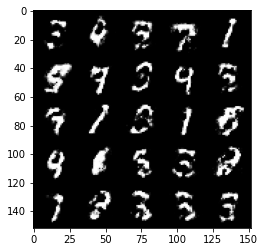

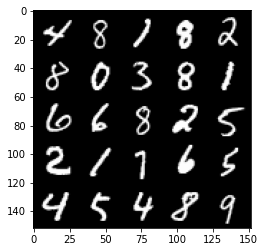

Step 84000: Generator loss: 1.263817528247833, discriminator loss: 0.4808361460566526


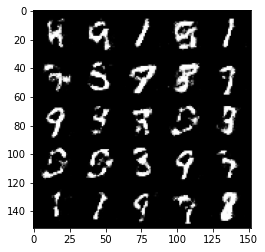

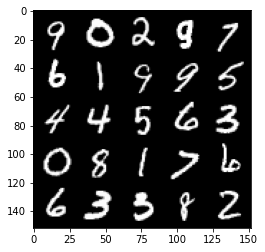

Step 84500: Generator loss: 1.2991383826732632, discriminator loss: 0.4657036098241811


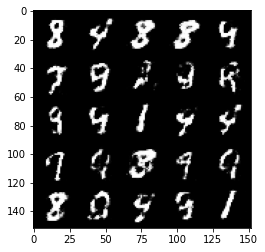

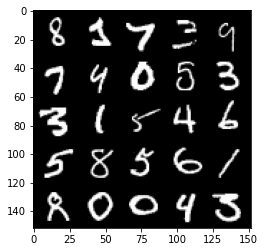

Step 85000: Generator loss: 1.3094647016525265, discriminator loss: 0.4691341851353648


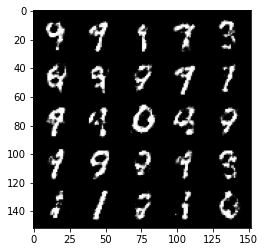

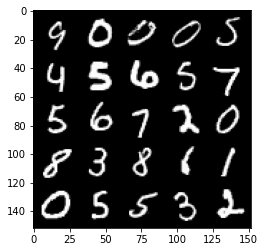

Step 85500: Generator loss: 1.3059396774768832, discriminator loss: 0.47537676459550815


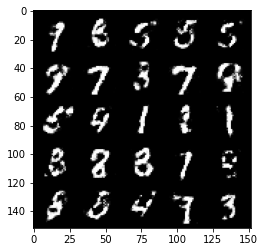

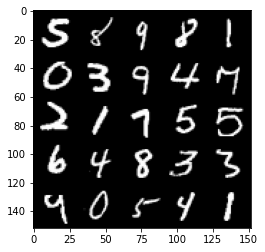

Step 86000: Generator loss: 1.2984622342586514, discriminator loss: 0.4781560447216033


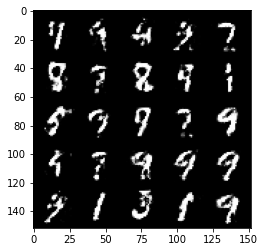

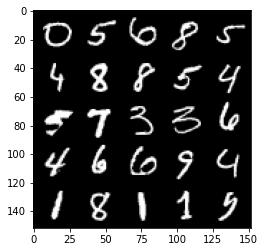

Step 86500: Generator loss: 1.345322613239287, discriminator loss: 0.4630524242520338


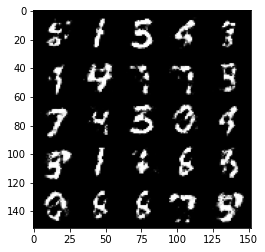

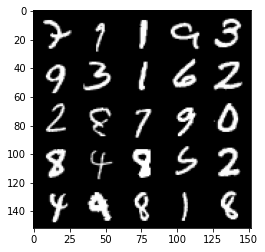

Step 87000: Generator loss: 1.2787134370803834, discriminator loss: 0.4893492264747619


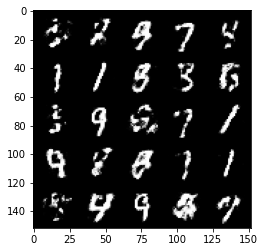

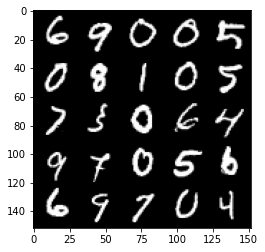

Step 87500: Generator loss: 1.246303194522856, discriminator loss: 0.4952480493187906


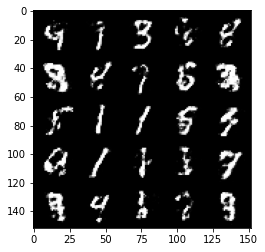

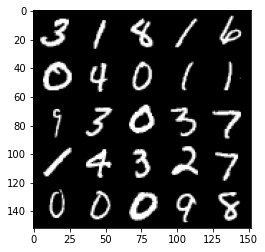

Step 88000: Generator loss: 1.2905533816814425, discriminator loss: 0.4726466016769407


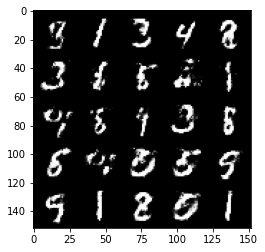

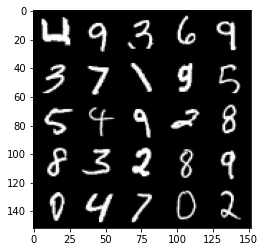

Step 88500: Generator loss: 1.2327787086963657, discriminator loss: 0.4952524699568745


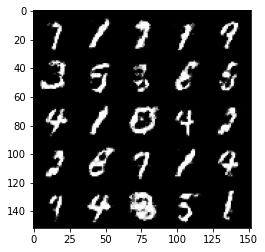

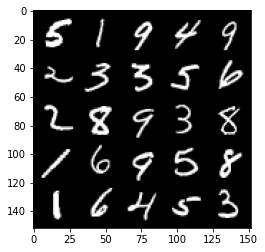

Step 89000: Generator loss: 1.2382131099700928, discriminator loss: 0.49297684520482987


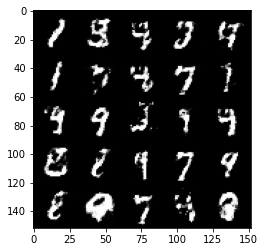

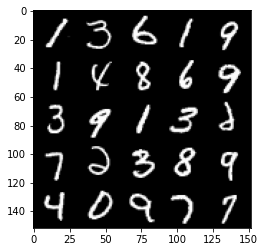

Step 89500: Generator loss: 1.2107792515754696, discriminator loss: 0.5031157546639439


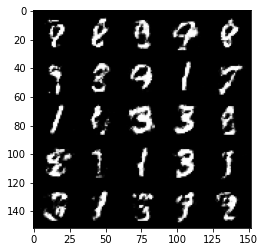

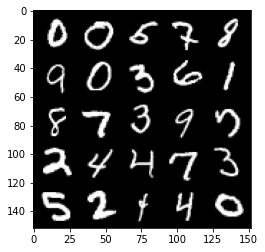

Step 90000: Generator loss: 1.2112537419795988, discriminator loss: 0.5055178073644632


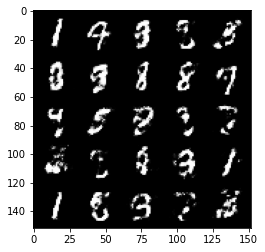

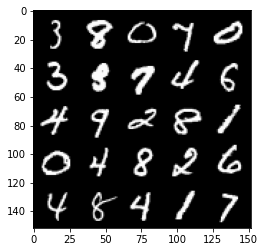

Step 90500: Generator loss: 1.2057522509098055, discriminator loss: 0.5132643043398853


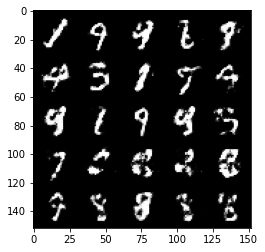

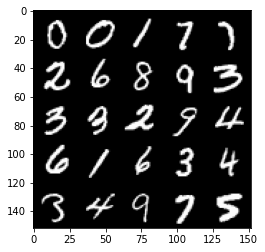

Step 91000: Generator loss: 1.1580609066486358, discriminator loss: 0.5226705530881883


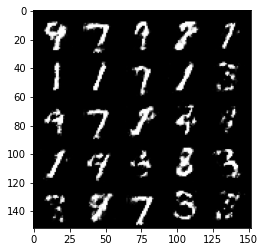

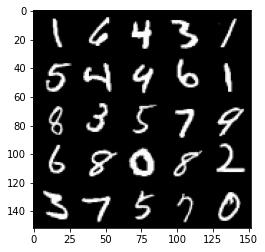

Step 91500: Generator loss: 1.1681350116729736, discriminator loss: 0.5080341123342513


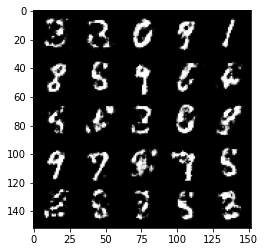

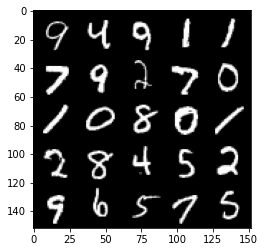

Step 92000: Generator loss: 1.198110577344895, discriminator loss: 0.5134757061004638


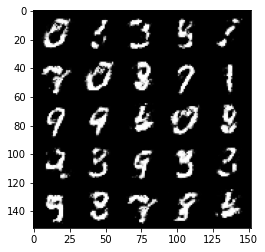

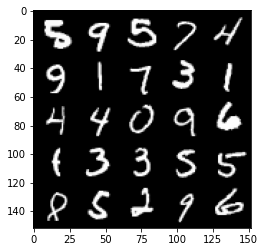

Step 92500: Generator loss: 1.2084838205575943, discriminator loss: 0.5062521013617515


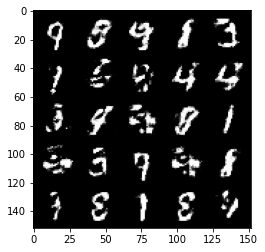

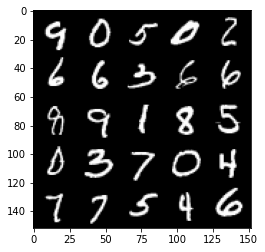

Step 93000: Generator loss: 1.1622495886087414, discriminator loss: 0.5144959815144545


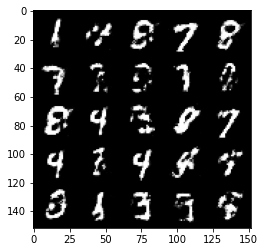

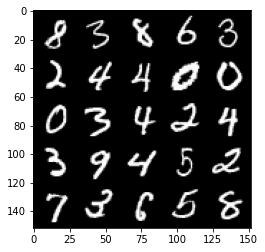

Step 93500: Generator loss: 1.1958159029483804, discriminator loss: 0.501099734127522


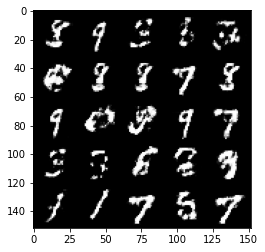

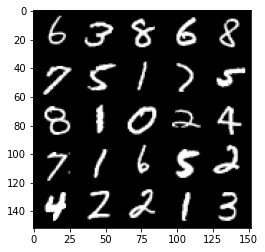

In [21]:
# UNQ_C8 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: 

cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True # Whether the generator should be tested
gen_loss = False
error = False
for epoch in range(n_epochs):
  
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        # Flatten the batch of real images from the dataset
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradients before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Update optimizer
        disc_opt.step()

        # For testing purposes, to keep track of the generator weights
        if test_generator:
            old_generator_weights = gen.gen[0][0].weight.detach().clone()

        ### Update generator ###
        #     Hint: This code will look a lot like the discriminator updates!
        #     These are the steps you will need to complete:
        #       1) Zero out the gradients.
        #       2) Calculate the generator loss, assigning it to gen_loss.
        #       3) Backprop through the generator: update the gradients and optimizer.
        #### START CODE HERE ####
        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen, disc,criterion, cur_batch_size, z_dim, device)
        gen_loss.backward()
        gen_opt.step()
        #### END CODE HERE ####

        # For testing purposes, to check that your code changes the generator weights
        if test_generator:
            try:
                assert lr > 0.0000002 or (gen.gen[0][0].weight.grad.abs().max() < 0.0005 and epoch == 0)
                assert torch.any(gen.gen[0][0].weight.detach().clone() != old_generator_weights)
            except:
                error = True
                print("Runtime tests have failed")

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1
